In [78]:
rm(list=ls())
library(MAST)
library(scran)
library(scds)
library(scDblFinder)
library(Seurat)
library(Matrix)
library(cowplot) 
library(gridExtra)
library(dplyr)
library(clustree)
library(DT)
library(pheatmap)
library(RColorBrewer)
library(gplots)
library(pracma)
library(monocle)
library(corrplot)
library(VennDiagram)
options(mc.cores = 64)

Loading required package: grid

Loading required package: futile.logger



<h2>1.Read multiple Seurat data (4 CL10) and merger into one object </h2>

In [2]:
data_list <- c("CL10P", "CL10D4", "CL10D7","CL10D14")
sc.list <- lapply(data_list, function(v){readRDS(paste0('/mnt/isilonX200/scRNA/Project_1/Result/', v,'.qc.Rds'))})

In [93]:
color_style = c("CL1-0-P-4" = "#14c770", "CL1-0-D4" = "#f5c242", "CL1-0-D7" = "#e86b5d", "CL1-0-D14" = "#54d1cd")
order_list = c("CL1-0-P-4","CL1-0-D4","CL1-0-D7","CL1-0-D14")

In [4]:
names(sc.list) <- data_list
sapply(sc.list, dim)

CL10P,CL10D4,CL10D7,CL10D14
33538,33538,33538,33538
3403,3681,3053,4025


In [5]:
sc.list

$CL10P
An object of class Seurat 
67076 features across 3403 samples within 2 assays 
Active assay: RNA (33538 features, 0 variable features)
 1 other assay present: logCPM

$CL10D4
An object of class Seurat 
67076 features across 3681 samples within 2 assays 
Active assay: RNA (33538 features, 0 variable features)
 1 other assay present: logCPM

$CL10D7
An object of class Seurat 
67076 features across 3053 samples within 2 assays 
Active assay: RNA (33538 features, 0 variable features)
 1 other assay present: logCPM

$CL10D14
An object of class Seurat 
67076 features across 4025 samples within 2 assays 
Active assay: RNA (33538 features, 0 variable features)
 1 other assay present: logCPM


In [6]:
scdata <- merge(sc.list[[1]], y = c(sc.list[[2]], sc.list[[3]], sc.list[[4]]))

In [7]:
scdata$condition <- factor(scdata$condition, levels = order_list, ordered = TRUE)
scdata

An object of class Seurat 
67076 features across 14162 samples within 2 assays 
Active assay: RNA (33538 features, 0 variable features)
 1 other assay present: logCPM

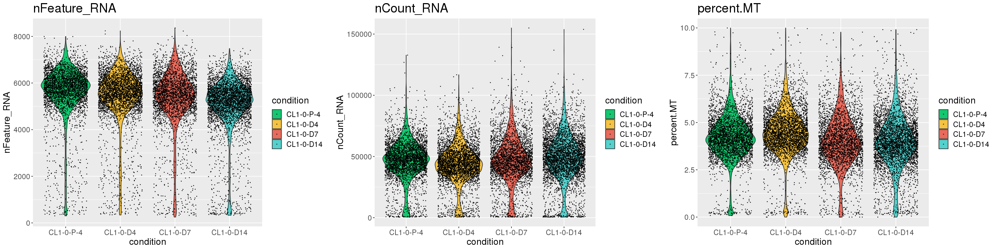

In [8]:
options(repr.plot.width=24, repr.plot.height=6)
vgp1 <- ggplot(scdata[[]], aes(x=condition, y=nFeature_RNA, fill=condition))+
        geom_violin()+
        geom_point(position="jitter", size=0.1)+
        theme(text = element_text(size = 16), plot.title = element_text(size=22))+
        scale_fill_manual(values = color_style)+
        labs(title = "nFeature_RNA")
vgp2 <- ggplot(scdata[[]], aes(x=condition, y=nCount_RNA, fill=condition))+
        geom_violin()+
        geom_point(position="jitter", size=0.1)+
        theme(text = element_text(size = 16), plot.title = element_text(size=22))+
        scale_fill_manual(values = color_style)+
        labs(title = "nCount_RNA")
vgp3 <- ggplot(scdata[[]], aes(x=condition, y=percent.MT, fill=condition))+
        geom_violin()+
        geom_point(position="jitter", size=0.1)+
        theme(text = element_text(size = 16), plot.title = element_text(size=22))+
        scale_fill_manual(values = color_style)+
        labs(title = "percent.MT")
plot_grid(vgp1, vgp2, vgp3, ncol=3)

In [9]:
ncells <- rowSums(GetAssayData(scdata, assay = 'RNA', slot = 'data') > 0)
scdata <- scdata[ncells > 15, ]
scdata
saveRDS(scdata, file = '/mnt/isilonX200/scRNA/Project_1/Result/CL10.merge.Rds')

An object of class Seurat 
37780 features across 14162 samples within 2 assays 
Active assay: RNA (18890 features, 0 variable features)
 1 other assay present: logCPM

<h2>2.Normalization (logCPM)</h2>

In [10]:
scdata <- readRDS(file = '/mnt/isilonX200/scRNA/Project_1/Result/CL10.merge.Rds')

In [11]:
scdata.count <- scdata
scdata <- NormalizeData(scdata)
scdata <- RenameAssays(scdata, RNA = 'logCPM')# GetAssayData(scdata, assay = 'logCPM', slot = 'data')[1:15,1:3]
scdata@assays$Count <- scdata.count@assays$RNA # scdata@active.assay <- 'logCPM'
scdata

Renaming default assay from RNA to logCPM



An object of class Seurat 
37780 features across 14162 samples within 2 assays 
Active assay: logCPM (18890 features, 0 variable features)
 1 other assay present: Count

In [12]:
str(scdata)

Formal class 'Seurat' [package "Seurat"] with 12 slots
  ..@ assays      :List of 2
  .. ..$ logCPM:Formal class 'Assay' [package "Seurat"] with 8 slots
  .. .. .. ..@ counts       :Formal class 'dgCMatrix' [package "Matrix"] with 6 slots
  .. .. .. .. .. ..@ i       : int [1:75732549] 2 8 9 13 14 18 20 22 24 26 ...
  .. .. .. .. .. ..@ p       : int [1:14163] 0 5160 11462 17126 23536 29978 36325 42384 47428 53524 ...
  .. .. .. .. .. ..@ Dim     : int [1:2] 18890 14162
  .. .. .. .. .. ..@ Dimnames:List of 2
  .. .. .. .. .. .. ..$ : chr [1:18890] "AL627309.1" "AL669831.5" "LINC00115" "FAM41C" ...
  .. .. .. .. .. .. ..$ : chr [1:14162] "AAACCTGAGGATATAC-CL1-0-P-4" "AAACCTGAGGGTCTCC-CL1-0-P-4" "AAACCTGCACATTTCT-CL1-0-P-4" "AAACGGGGTCCCTACT-CL1-0-P-4" ...
  .. .. .. .. .. ..@ x       : num [1:75732549] 1 2 1 43 13 8 1 5 2 1 ...
  .. .. .. .. .. ..@ factors : list()
  .. .. .. ..@ data         :Formal class 'dgCMatrix' [package "Matrix"] with 6 slots
  .. .. .. .. .. ..@ i       : int [

<h2>3.Highly variable genes (vst, top4000)</h2>

In [13]:
scdata <- FindVariableFeatures(scdata, selection.method = "vst", nfeatures = 4000)

Warning message:
"Using `as.character()` on a quosure is deprecated as of rlang 0.3.0.
Please use `as_label()` or `as_name()` instead.
This warning is displayed once per session."


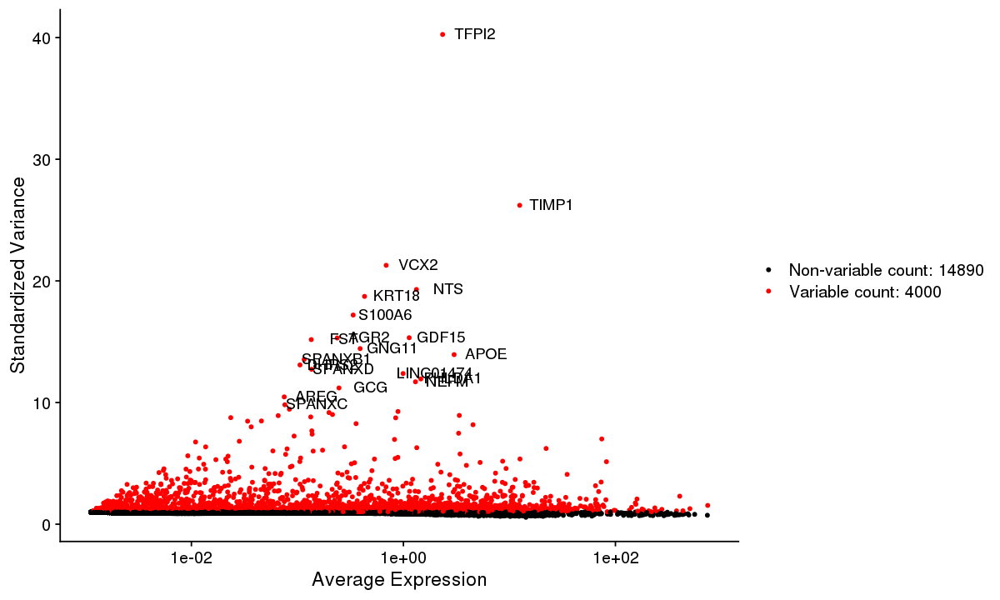

In [14]:
options(repr.plot.width = 10, repr.plot.height = 6)
LabelPoints(plot = VariableFeaturePlot(scdata), points = head(VariableFeatures(scdata), 20))

<h2>4.Dimension reduction: PCA (Scaled data: mean 0 and sd 1;Correction : cellcycle effect, technical effect)</h2>

Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.

Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.



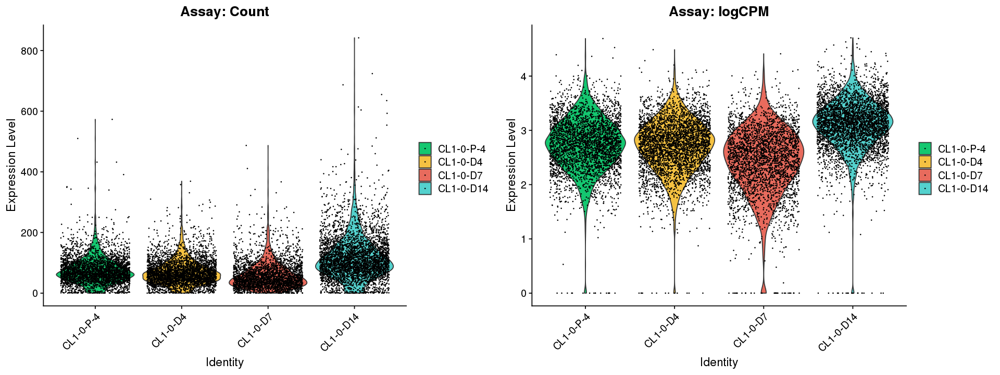

In [15]:
options(repr.plot.width=16, repr.plot.height=6)
MT2A_vp1 <- VlnPlot(scdata, 'LGALS1', assay = "Count", pt.size = 0.1, group.by = 'condition', col = brewer.pal(5, 'Dark2'))+
                    scale_fill_manual(values = color_style)+
                    labs(title = "Assay: Count")
MT2A_vp2 <- VlnPlot(scdata, 'LGALS1', assay = "logCPM", pt.size = 0.1, group.by = 'condition', col = brewer.pal(5, 'Dark2'))+
                    scale_fill_manual(values = color_style)+
                    labs(title = "Assay: logCPM")
plot_grid(MT2A_vp1, MT2A_vp2, ncol=2)

In [16]:
# scdata <- CellCycleScoring(object = scdata, assay = 'logCPM',
#                            g2m.features = cc.genes.updated.2019$g2m.genes, 
#                            s.features = cc.genes.updated.2019$s.genes)
#################################################################################3
# scdata$logCount_logCPM <- log(scdata$nCount_logCPM + 1)
# scdata$logpercent.MT <- log(scdata$percent.MT + 1)
# scdata <- ScaleData(object = scdata, do.scale = FALSE, verbose = FALSE,
#                    vars.to.regress = c('logCount_logCPM', 'logpercent.MT', 'S.Score', 'G2M.Score'))
scdata <- ScaleData(object = scdata, features = VariableFeatures(scdata), verbose = FALSE)

In [17]:
scdata <- RunPCA(object = scdata, features = VariableFeatures(scdata), verbose = FALSE, assay = 'logCPM', npcs = 100, reduction.name = 'pca')

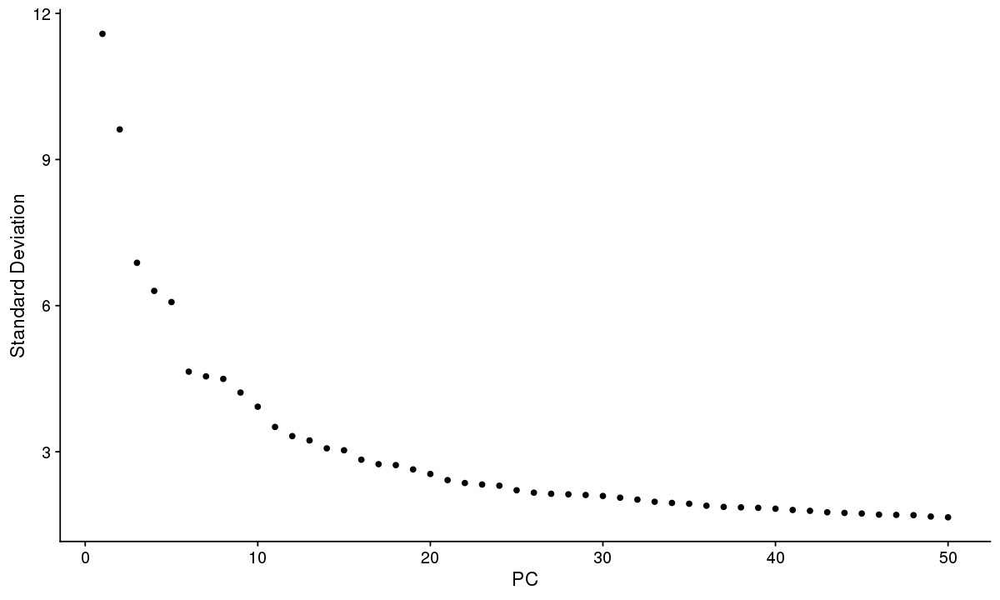

In [18]:
options(repr.plot.width=10, repr.plot.height=6)
ElbowPlot(scdata, ndims = 50)

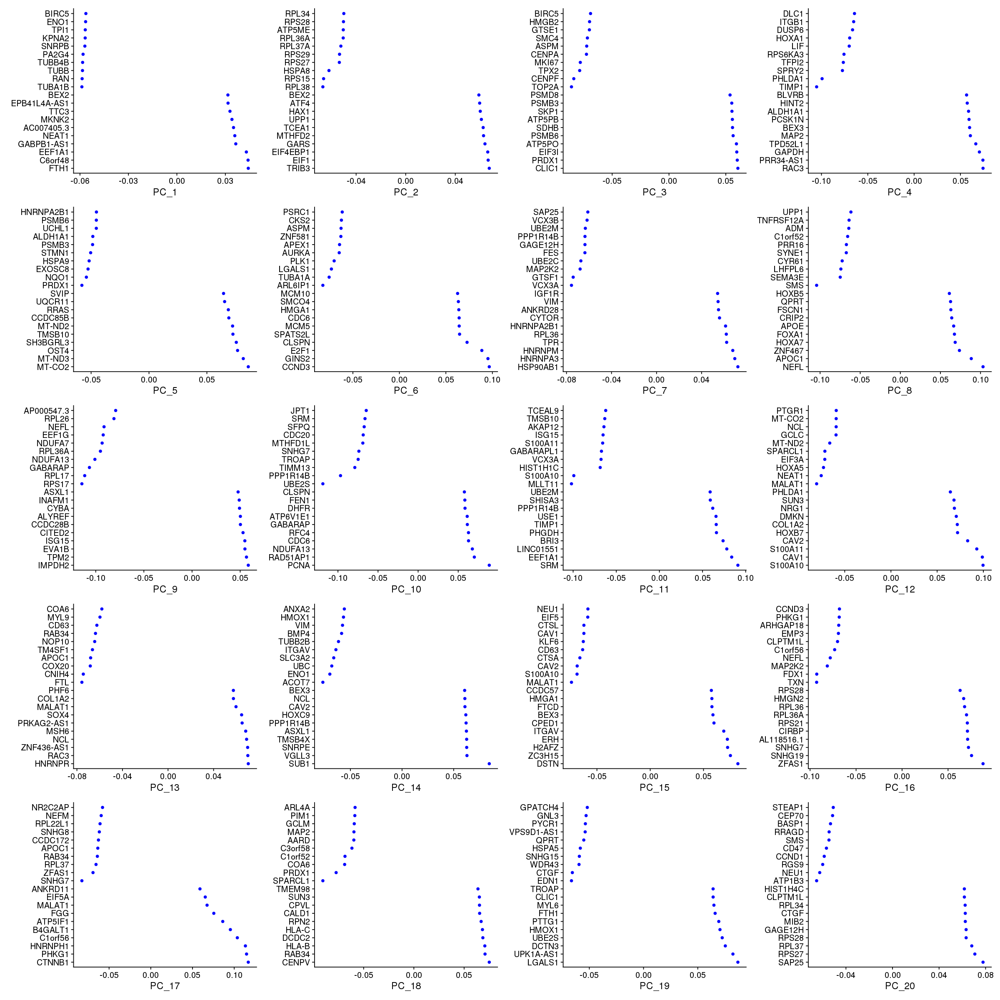

In [19]:
options(repr.plot.width = 20, repr.plot.height = 20)
VizDimLoadings(scdata, dims = 1:20, reduction = "pca", nfeatures = 20, balanced = TRUE, ncol = 4)

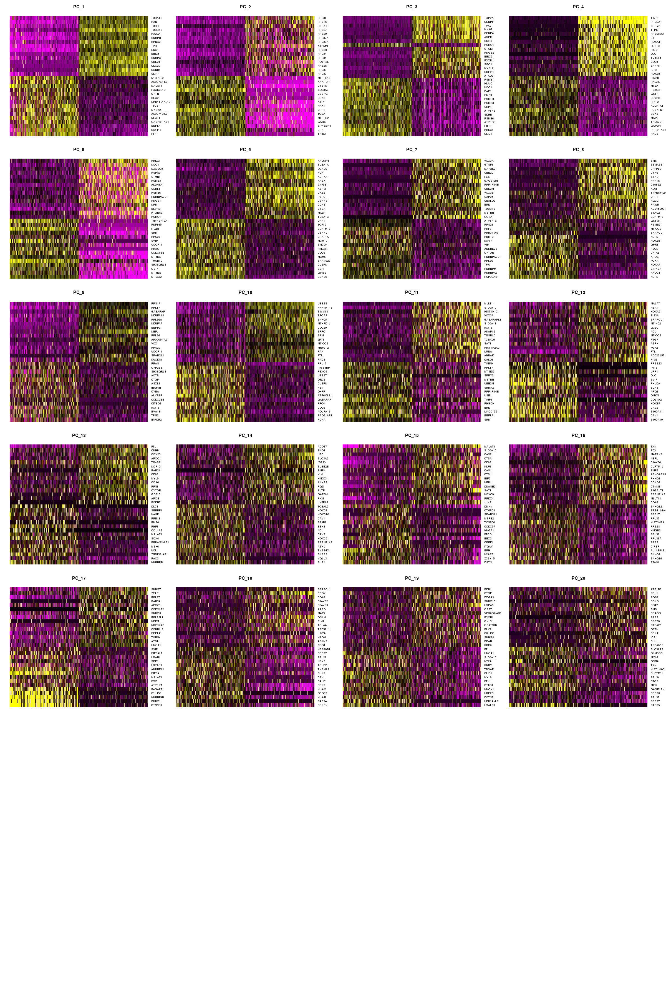

In [20]:
options(repr.plot.width = 20, repr.plot.height = 30)
DimHeatmap(scdata, dims = 1:20, cells = 500, reduction = "pca", balanced = TRUE, ncol = 4)


Attaching package: 'future'


The following object is masked from 'package:SummarizedExperiment':

    values


The following object is masked from 'package:GenomicRanges':

    values


The following object is masked from 'package:IRanges':

    values


The following object is masked from 'package:S4Vectors':

    values


Warning message:
"Removed 293595 rows containing missing values (geom_point)."


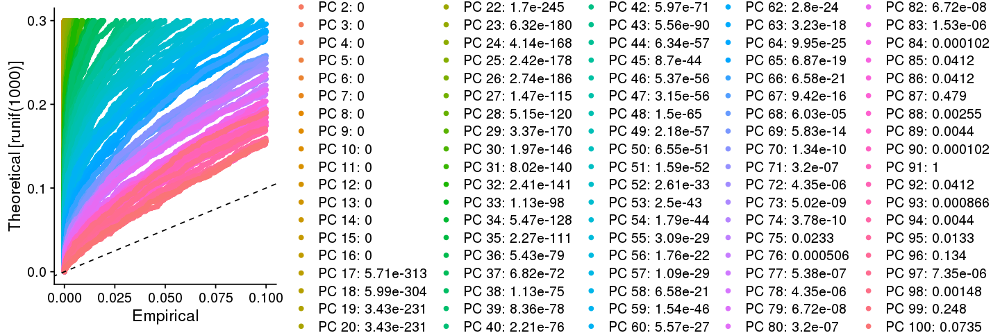

In [21]:
library(future)
plan("multiprocess", workers = 64)
options(repr.plot.width=12, repr.plot.height=4)
scdata <- JackStraw(scdata, num.replicate = 300, dims = 100)
scdata <- ScoreJackStraw(scdata, dims = 1:100)
JackStrawPlot(scdata, dims = 1:100)

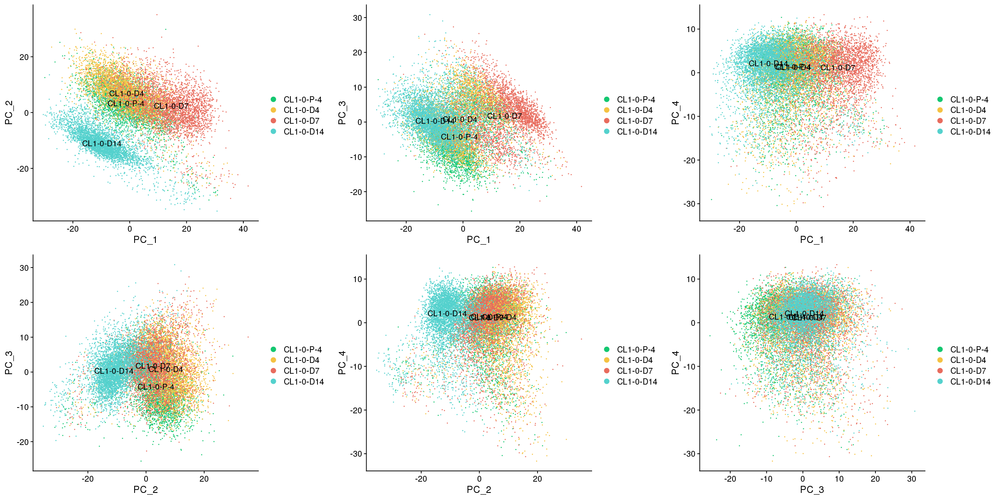

In [22]:
options(repr.plot.width = 20, repr.plot.height = 10)
pcc1 <- DimPlot(object = scdata, reduction = "pca", dims = c(1, 2), group.by = "condition", label = TRUE, cols = color_style)
pcc2 <- DimPlot(object = scdata, reduction = "pca", dims = c(1, 3), group.by = "condition", label = TRUE, cols = color_style)
pcc3 <- DimPlot(object = scdata, reduction = "pca", dims = c(1, 4), group.by = "condition", label = TRUE, cols = color_style)
pcc4 <- DimPlot(object = scdata, reduction = "pca", dims = c(2, 3), group.by = "condition", label = TRUE, cols = color_style)
pcc5 <- DimPlot(object = scdata, reduction = "pca", dims = c(2, 4), group.by = "condition", label = TRUE, cols = color_style)
pcc6 <- DimPlot(object = scdata, reduction = "pca", dims = c(3, 4), group.by = "condition", label = TRUE, cols = color_style)
plot_grid(pcc1, pcc2, pcc3, pcc4, pcc5, pcc6, ncol = 3)

<h2>5.Cell Cycle</h2>

In [23]:
scdata <- CellCycleScoring(object = scdata, assay = 'logCPM',
                           g2m.features = cc.genes.updated.2019$g2m.genes, 
                           s.features = cc.genes.updated.2019$s.genes)

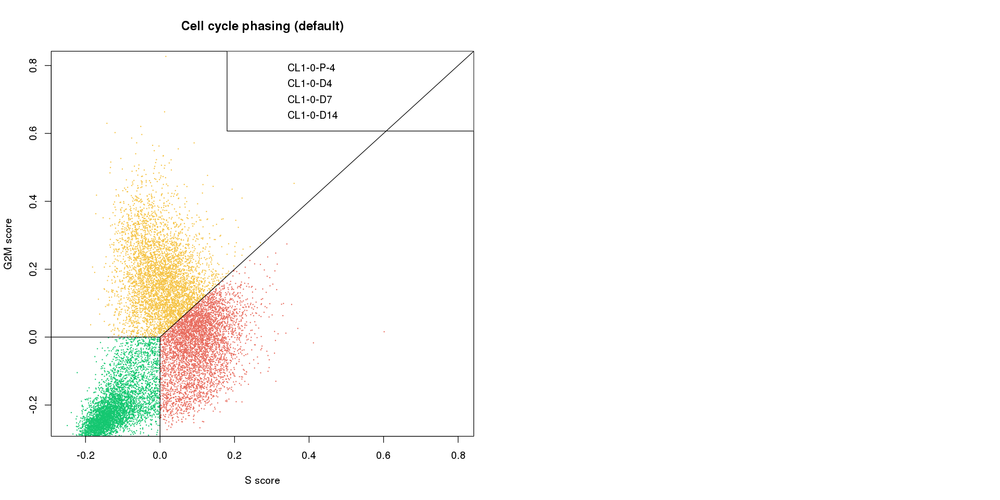

In [24]:
options(repr.plot.width = 16, repr.plot.height = 8)
par(mfrow = c(1, 2))
plot(cbind(scdata$S.Score, scdata$G2M.Score),
     cex = 0.2, pch = 20, xlab = 'S score', ylab = 'G2M score', main = 'Cell cycle phasing (default)', xlim = c(-0.25, 0.8), ylim = c(-0.25, 0.8),
     col = color_style[factor(scdata$Phase)])
legend("topright", legend=order_list, col = color_style)
rect(-10, -10, 0, 0)
segments(0, 0, 1, 1)

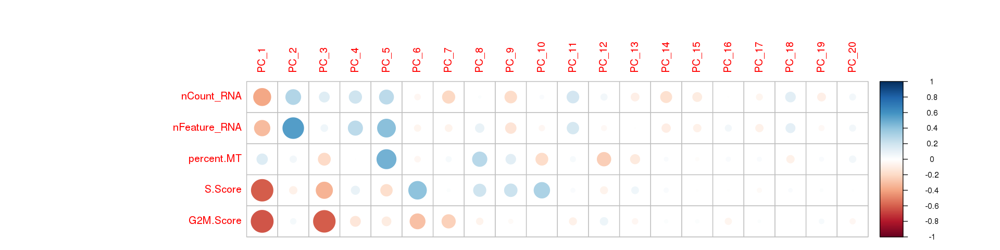

In [25]:
options(repr.plot.width = 16, repr.plot.height = 4)
cor.pca.meta <- cor(scdata@reductions$pca@cell.embeddings[, 1:20], scdata@meta.data[, c('nCount_RNA', 'nFeature_RNA', 'percent.MT', 'S.Score', 'G2M.Score')])#, method = 'spear')
corrplot(t(cor.pca.meta), method = "circle")

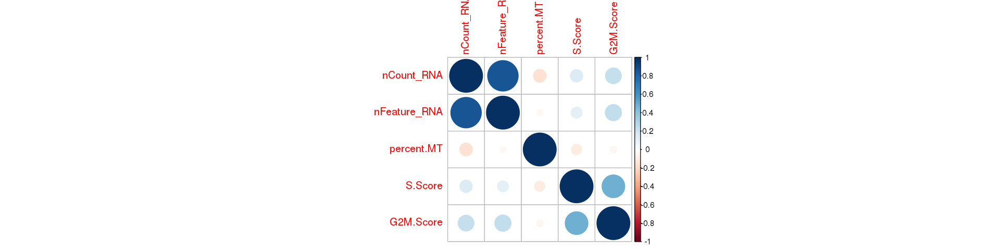

In [26]:
options(repr.plot.width = 16, repr.plot.height = 4)
cor.meta <- cor(scdata@meta.data[, c('nCount_RNA', 'nFeature_RNA', 'percent.MT', 'S.Score', 'G2M.Score')], scdata@meta.data[, c('nCount_RNA', 'nFeature_RNA', 'percent.MT', 'S.Score', 'G2M.Score')], method = 'spear')
corrplot(cor.meta, method = "circle")

In [27]:
saveRDS(scdata, file = '/mnt/isilonX200/scRNA/Project_1/Result/CL10.merge.Rds')

In [28]:
head(scdata[[]])

,orig.ident,nCount_RNA,nFeature_RNA,condition,percent.MT,nCount_logCPM,nFeature_logCPM,S.Score,G2M.Score,Phase
,<chr>,<dbl>,<int>,<ord>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<fct>
AAACCTGAGGATATAC-CL1-0-P-4,Project_1,34903,5160,CL1-0-P-4,6.890525,34903,5160,-0.058171952,0.15100343,G2M
AAACCTGAGGGTCTCC-CL1-0-P-4,Project_1,57950,6302,CL1-0-P-4,4.880069,57950,6302,0.086214927,0.06493860,S
AAACCTGCACATTTCT-CL1-0-P-4,Project_1,50945,5664,CL1-0-P-4,3.232771,50945,5664,0.002628155,0.06374253,G2M
AAACGGGGTCCCTACT-CL1-0-P-4,Project_1,57222,6410,CL1-0-P-4,2.855445,57222,6410,0.004330711,0.27030043,G2M
AAACGGGTCACCATAG-CL1-0-P-4,Project_1,60751,6442,CL1-0-P-4,3.932446,60751,6442,0.084881513,0.03227717,S
AAACGGGTCAGCACAT-CL1-0-P-4,Project_1,58969,6347,CL1-0-P-4,3.637381,58969,6347,0.040126088,0.12370296,G2M


<h2>6.Visualization: tSNE, UMAP</h>

In [29]:
pc <- 20
scdata <- RunUMAP(scdata, reduction = "pca", dims = 1:pc)
scdata <- RunTSNE(scdata, reduction = "pca", dims = 1:pc, max_iter = 2000)

Warning message:
"The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session"
05:13:49 UMAP embedding parameters a = 0.9922 b = 1.112

05:13:49 Read 14162 rows and found 20 numeric columns

05:13:49 Using Annoy for neighbor search, n_neighbors = 30

05:13:49 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*

|

05:13:52 Writing NN index file to temp file /tmp/Rtmp4gH3B6/file678c6ee1c133

05:13:52 Searching Annoy index using 64 threads, search_k = 3000

05:13:53 Annoy recall = 100%

05:13:54 Commencing smooth kNN distance calibration using 64 threads

05:13:56 Initializi

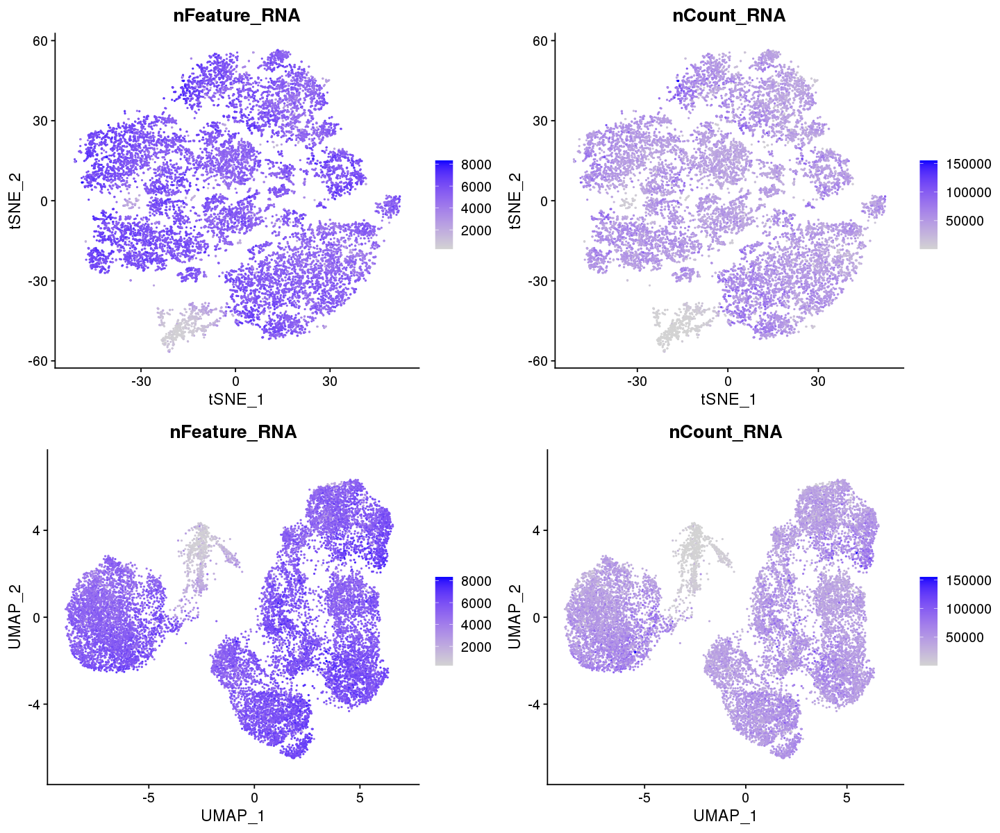

In [30]:
options(repr.plot.width=12, repr.plot.height=10)
fp1 <- FeaturePlot(scdata, features = "nFeature_RNA", pt.size = 0.25, reduction = "tsne")
fp2 <- FeaturePlot(scdata, features = "nCount_RNA", pt.size = 0.25, reduction = "tsne")
fp3 <- FeaturePlot(scdata, features = "nFeature_RNA", pt.size = 0.25, reduction = "umap")
fp4 <- FeaturePlot(scdata, features = "nCount_RNA", pt.size = 0.25, reduction = "umap")
plot_grid(fp1, fp2, fp3, fp4, ncol = 2, nrow = 2)

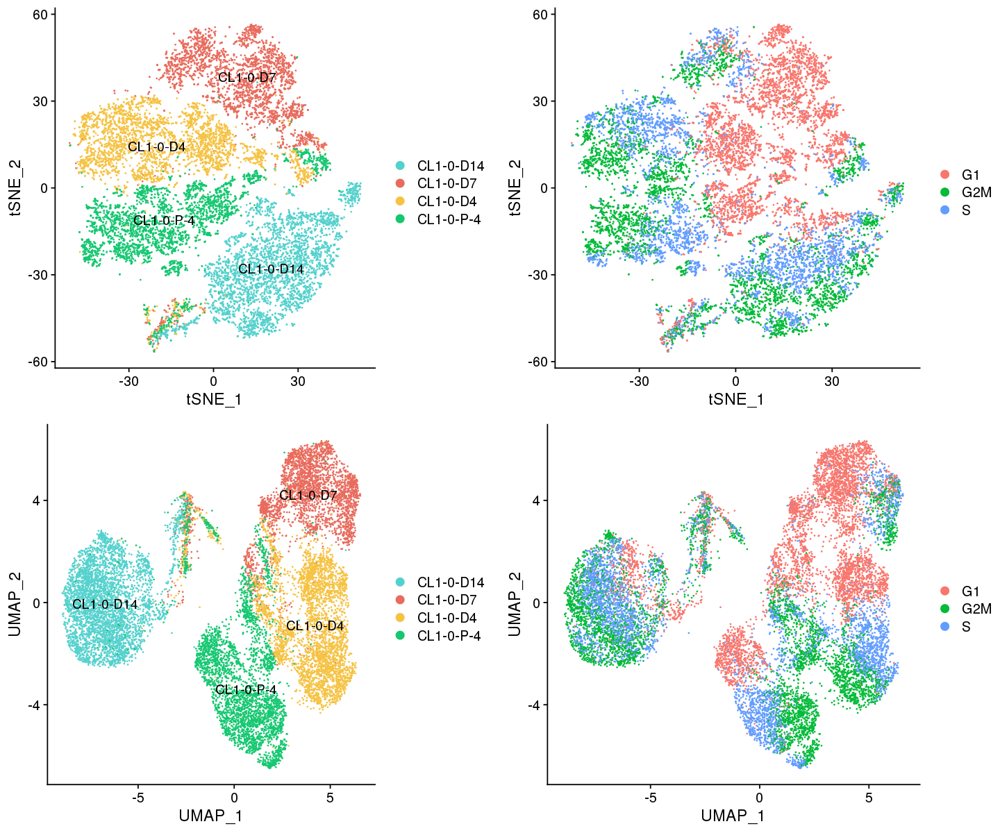

In [31]:
options(repr.plot.width=12, repr.plot.height=10)
tp1 <- DimPlot(object = scdata, reduction = "tsne", group.by = "condition", order = order_list, label = TRUE, cols = color_style)
tp2 <- DimPlot(object = scdata, reduction = "tsne", group.by = "Phase")
up1 <- DimPlot(object = scdata, reduction = "umap", group.by = "condition", order = order_list, label = TRUE, cols = color_style)
up2 <- DimPlot(object = scdata, reduction = "umap", group.by = "Phase") 
plot_grid(tp1, tp2, up1, up2, ncol=2)

### Resolution

In [45]:
resolutions <- seq(0, 1.2, 0.1) 
pc <- 84

In [46]:
scdata <- FindNeighbors(object = scdata, reduction = "pca", dims = 1:pc)
scdata <- FindClusters(scdata, resolution = resolutions)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 14162
Number of edges: 577003

Running Louvain algorithm...
Maximum modularity in 10 random starts: 1.0000
Number of communities: 1
Elapsed time: 1 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 14162
Number of edges: 577003

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9549
Number of communities: 6
Elapsed time: 2 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 14162
Number of edges: 577003

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9328
Number of communities: 8
Elapsed time: 1 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 14162
Number of edges: 577003

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9142
Number of communities: 11
Elapsed time: 2 seconds
Modularity Opti

In [47]:
head(scdata@meta.data)

,orig.ident,nCount_RNA,nFeature_RNA,condition,percent.MT,nCount_logCPM,nFeature_logCPM,S.Score,G2M.Score,Phase,...,logCPM_snn_res.0.4,logCPM_snn_res.0.5,logCPM_snn_res.0.6,logCPM_snn_res.0.7,logCPM_snn_res.0.8,logCPM_snn_res.0.9,logCPM_snn_res.1,logCPM_snn_res.1.1,logCPM_snn_res.1.2,seurat_clusters
,<chr>,<dbl>,<int>,<ord>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<fct>,...,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>
AAACCTGAGGATATAC-CL1-0-P-4,Project_1,34903,5160,CL1-0-P-4,6.890525,34903,5160,-0.058171952,0.15100343,G2M,...,2,1,1,1,3,3,3,3,3,3
AAACCTGAGGGTCTCC-CL1-0-P-4,Project_1,57950,6302,CL1-0-P-4,4.880069,57950,6302,0.086214927,0.06493860,S,...,2,1,1,1,13,13,15,16,16,16
AAACCTGCACATTTCT-CL1-0-P-4,Project_1,50945,5664,CL1-0-P-4,3.232771,50945,5664,0.002628155,0.06374253,G2M,...,2,1,1,1,3,3,3,3,3,3
AAACGGGGTCCCTACT-CL1-0-P-4,Project_1,57222,6410,CL1-0-P-4,2.855445,57222,6410,0.004330711,0.27030043,G2M,...,2,1,1,1,3,3,6,6,6,6
AAACGGGTCACCATAG-CL1-0-P-4,Project_1,60751,6442,CL1-0-P-4,3.932446,60751,6442,0.084881513,0.03227717,S,...,2,1,1,1,13,13,15,16,16,16
AAACGGGTCAGCACAT-CL1-0-P-4,Project_1,58969,6347,CL1-0-P-4,3.637381,58969,6347,0.040126088,0.12370296,G2M,...,11,13,13,14,16,16,18,19,19,19


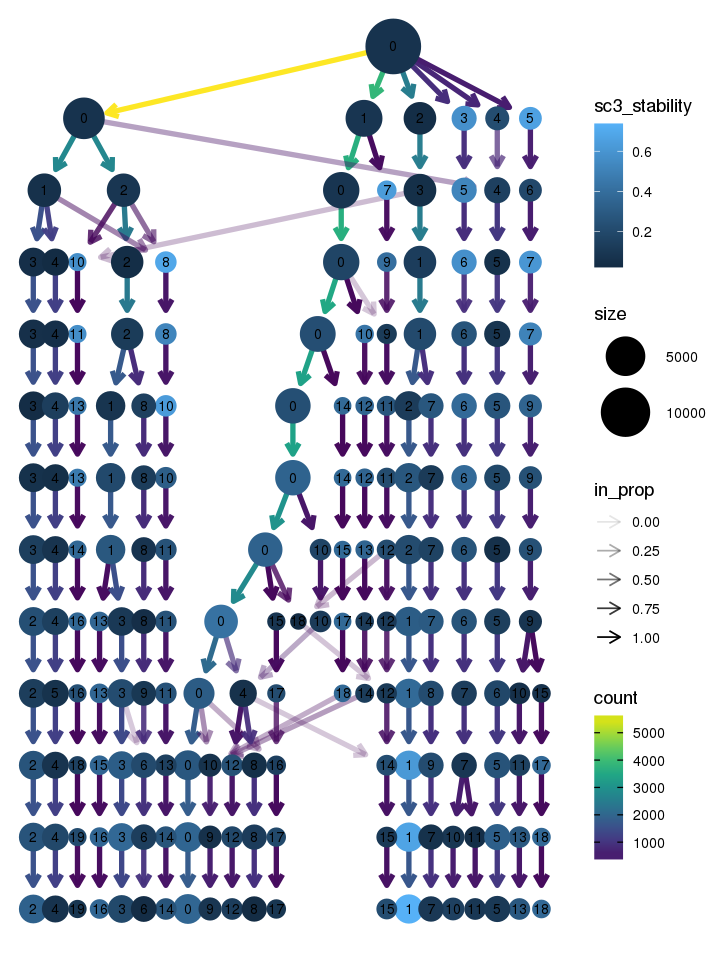

In [48]:
options(repr.plot.width=6, repr.plot.height=8)
clustree(scdata, node_colour = "sc3_stability")

In [49]:
# 用來算clustree每一層也就是分幾群的時候分數最高 
# :: 是用來找一個package下的某個function, :::是用來找一個package下的某個隱藏function
tmp <- clustree:::calc_sc3_stability(scdata[[]][,13:24])
# 標準差 / 平均值 / 變異係數
data.frame(tmp) %>% group_by(resolution) %>% summarise(sum(stability),sd(stability),mean(stability),sd(stability)/mean(stability)) 

resolution,sum(stability),sd(stability),mean(stability),sd(stability)/mean(stability)
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,1.824790,0.2692478,0.2280987,1.1804003
2,3.636303,0.3173960,0.3305730,0.9601388
3,3.516482,0.2411006,0.2930401,0.8227561
4,4.508102,0.1979068,0.3005401,0.6585037
5,3.978912,0.1500270,0.2652608,0.5655829
6,3.911992,0.1213413,0.2444995,0.4962846
7,4.306056,0.1465046,0.2266345,0.6464356
8,4.064591,0.1271266,0.2139259,0.5942555
9,5.028606,0.1416236,0.2646635,0.5351083


In [5]:
pc <- 84
scdata <- FindNeighbors(object = scdata, reduction = "pca", dims = 1:pc)
scdata <- FindClusters(scdata, resolution = 0.6)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 14162
Number of edges: 577003

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8756
Number of communities: 15
Elapsed time: 1 seconds


In [6]:
reduction_name <- "res0.6"
scdata <- RunUMAP(scdata, reduction = "pca",reduction.name = paste0("umap_", reduction_name, '_pc'), dims = 1:pc)
scdata <- RunTSNE(scdata, reduction = "pca", reduction.name = paste0("tsne_", reduction_name, '_pc'), dims = 1:pc, max_iter = 2000)

Warning message:
"The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session"
06:44:56 UMAP embedding parameters a = 0.9922 b = 1.112

06:44:56 Read 14162 rows and found 84 numeric columns

06:44:56 Using Annoy for neighbor search, n_neighbors = 30

06:44:56 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*

|

06:44:59 Writing NN index file to temp file /tmp/RtmpSQfvdp/file8f1e75ed97be

06:44:59 Searching Annoy index using 1 thread, search_k = 3000

06:45:04 Annoy recall = 100%

06:45:05 Commencing smooth kNN distance calibration using 1 thread

06:45:08 Initializing f

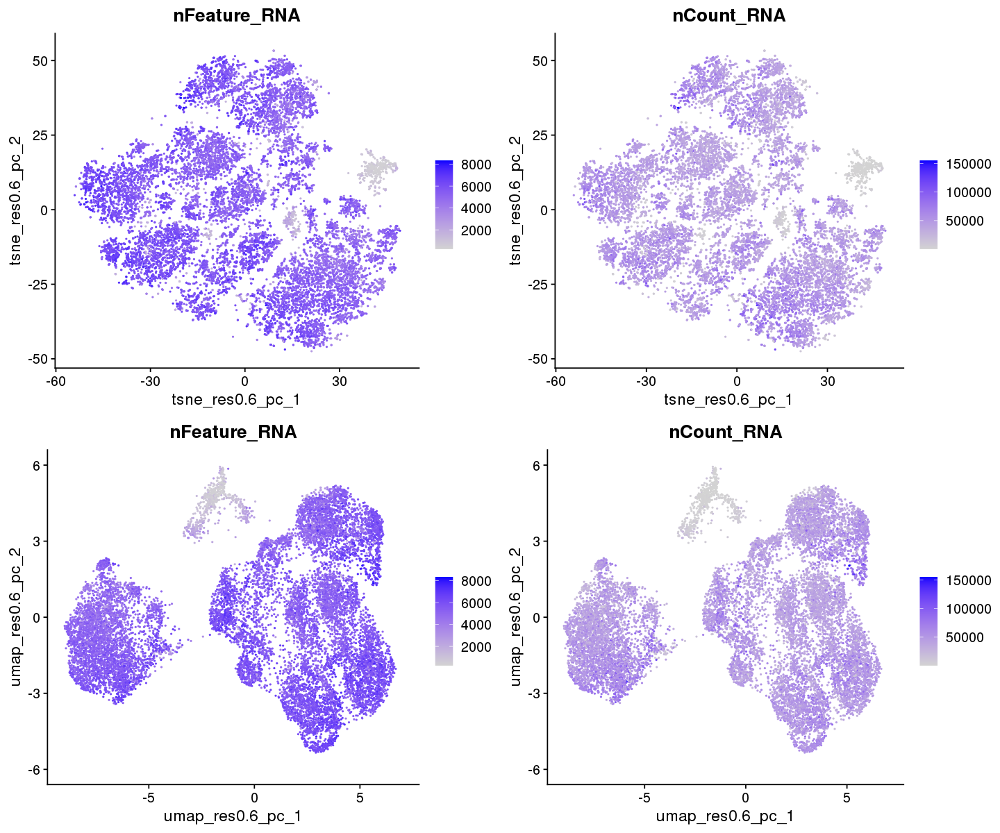

In [7]:
options(repr.plot.width=12, repr.plot.height=10)
fp1 <- FeaturePlot(scdata, features = "nFeature_RNA", pt.size = 0.25, reduction = "tsne_res0.6_pc")
fp2 <- FeaturePlot(scdata, features = "nCount_RNA", pt.size = 0.25, reduction = "tsne_res0.6_pc")
fp3 <- FeaturePlot(scdata, features = "nFeature_RNA", pt.size = 0.25, reduction = "umap_res0.6_pc")
fp4 <- FeaturePlot(scdata, features = "nCount_RNA", pt.size = 0.25, reduction = "umap_res0.6_pc")
plot_grid(fp1, fp2, fp3, fp4, ncol = 2, nrow = 2)

Warning message:
"Using `as.character()` on a quosure is deprecated as of rlang 0.3.0.
Please use `as_label()` or `as_name()` instead.
This warning is displayed once per session."


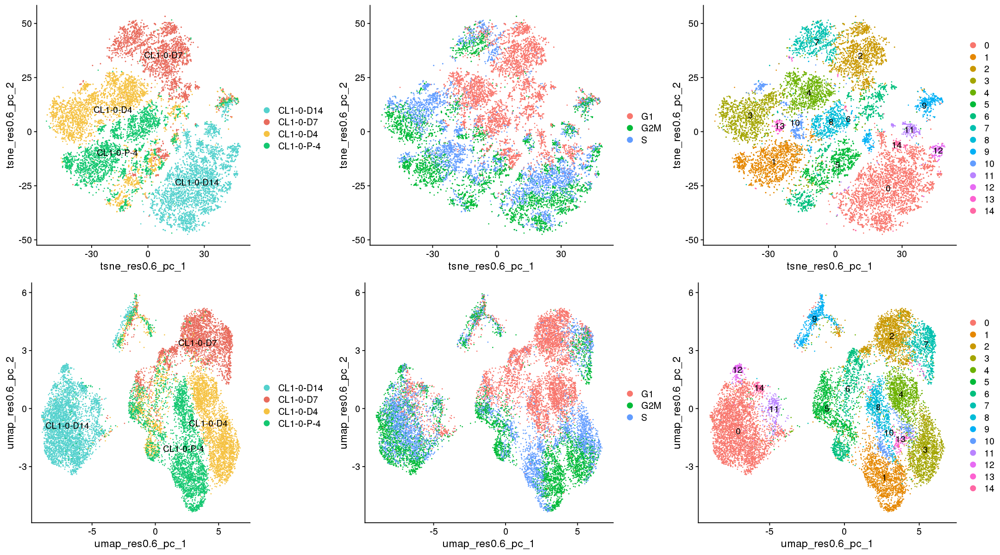

In [10]:
options(repr.plot.width=18, repr.plot.height=10)
tp1 <- DimPlot(object = scdata, reduction = "tsne_res0.6_pc", group.by = "condition", order = order_list, label = TRUE, cols = color_style)
tp2 <- DimPlot(object = scdata, reduction = "tsne_res0.6_pc", group.by = "Phase")
tp3 <- DimPlot(object = scdata, reduction = "tsne_res0.6_pc", label = TRUE)
up1 <- DimPlot(object = scdata, reduction = "umap_res0.6_pc", group.by = "condition", order = order_list, label = TRUE, cols = color_style)
up2 <- DimPlot(object = scdata, reduction = "umap_res0.6_pc", group.by = "Phase")
up3 <- DimPlot(object = scdata, reduction = "umap_res0.6_pc", label = TRUE)
plot_grid(tp1, tp2, tp3,up1, up2, up3, ncol=3)

In [11]:
plot.data <- scdata@meta.data %>%
    select(condition, cluster = logCPM_snn_res.0.6) %>%
    mutate(cluster = factor(cluster)) %>%
    mutate(condition = factor(condition, levels = order_list))%>%
    group_by(cluster, condition) %>%
    summarise(count = n()) %>%
    mutate(clust_total = sum(count)) %>%
    mutate(clust_prop = count / clust_total) %>%
    group_by(condition) %>%
    mutate(dataset_total = sum(count)) %>%
    ungroup() %>%
    mutate(dataset_prop = count / dataset_total)

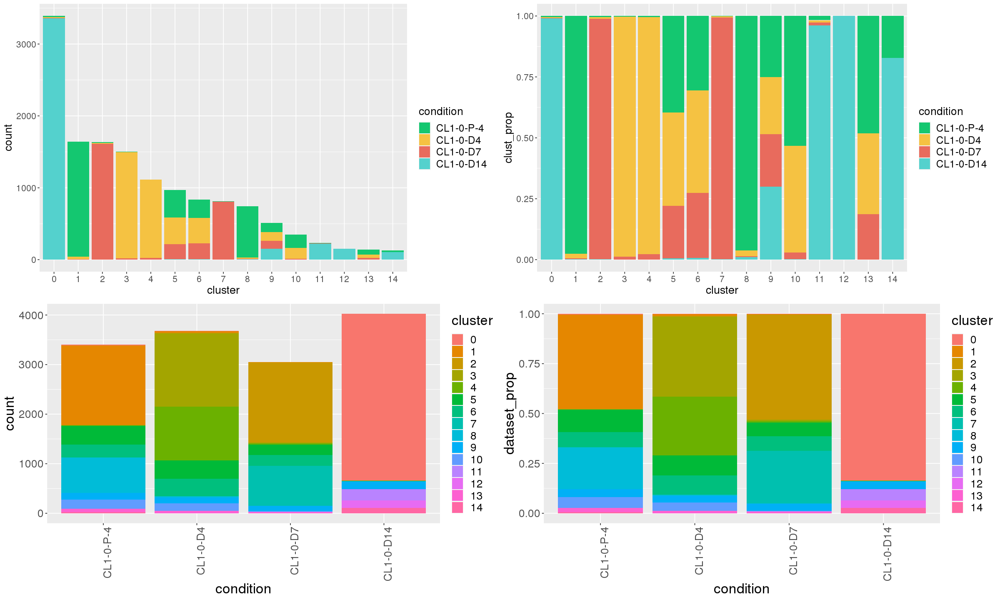

In [12]:
options(repr.plot.width=20, repr.plot.height=12)

gp1<-ggplot(plot.data, aes(x = cluster, y = count, fill = condition)) +
    geom_col()+
    scale_fill_manual(values = color_style)+
    theme(legend.text=element_text(size=15), text = element_text(size = 16))

gp2<-ggplot(plot.data, aes(x = cluster, y = clust_prop, fill = condition)) +
    geom_col()+
    scale_fill_manual(values = color_style)+
    theme(legend.text=element_text(size=15), text = element_text(size = 16))

gp3<-ggplot(plot.data, aes(x = condition, y = count, fill = cluster)) +
    geom_col()+
    theme(text = element_text(size = 20), axis.text.x = element_text(angle=90, hjust=1))

gp4<-ggplot(plot.data, aes(x = condition, y = dataset_prop, fill = cluster)) +
    geom_col()+
    theme(text = element_text(size = 20), axis.text.x = element_text(angle=90, hjust=1))

plot_grid(gp1, gp2, gp3, gp4, ncol = 2)

In [70]:
# saveRDS(file ="/mnt/isilonX200/scRNA/Project_1/Result/CL10.merge.Rds", object = scdata)
# scdata <- readRDS(file ="/mnt/isilonX200/scRNA/Project_1/Result/CL10.merge.Rds")

<h2>7.Different Expression</h>

In [13]:
# Idents(scdata) <- scdata@meta.data$logCPM_snn_res.0.6
scdata.markers <- FindAllMarkers(object = scdata, features = VariableFeatures(scdata)) 
top20 = scdata.markers %>% group_by(cluster) %>% top_n(n = 20, wt = avg_logFC)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11

Calculating cluster 12

Calculating cluster 13

Calculating cluster 14



In [14]:
head(top20)

p_val,avg_logFC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
0,1.2277722,0.999,0.836,0,0,HSPA8
0,0.8872157,0.994,0.962,0,0,HIST1H4C
0,0.8552257,0.998,0.965,0,0,POLR2L
0,0.7158007,0.999,0.976,0,0,SLIRP
0,0.6836523,1.000,0.997,0,0,RPL38
0,0.6732124,0.999,0.984,0,0,ATP5ME


In [15]:
MinMax <- function(data, min, max) {
  data2 <- data
  data2[data2 > max] <- max
  data2[data2 < min] <- min
  return(data2)
}

plot_heatmap <- as.data.frame(x = t(as.matrix(x = t(x = GetAssayData(
    object = scdata,
    slot = 'scale.data')[top20$gene ,cells <- colnames(x = scdata)]))))

annotation_col <- scdata@meta.data[,c("condition", "logCPM_snn_res.0.1"), drop = FALSE]
annotation_col <- annotation_col[order(annotation_col$condition, annotation_col$logCPM_snn_res.0.1),]
plot_heatmap <- plot_heatmap[,rownames(annotation_col)]
plot_heatmap <- MinMax(plot_heatmap,-3.5,3.5)
aka3 = list(condition = color_style)

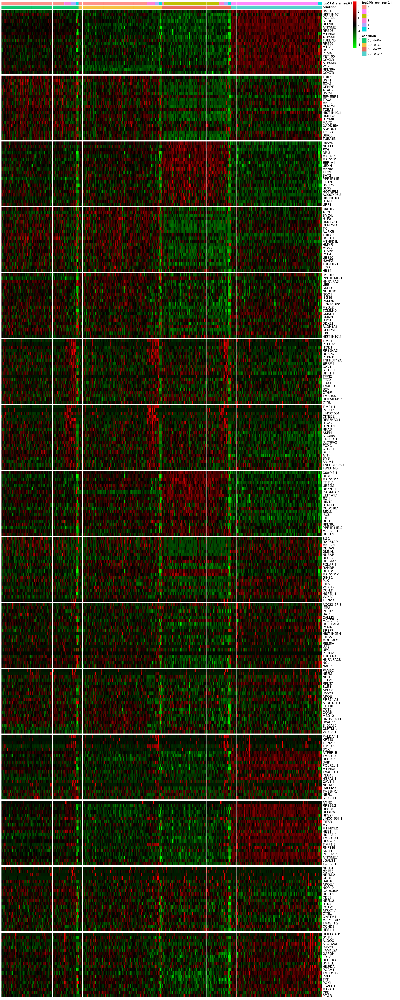

In [16]:
options(repr.plot.width = 18, repr.plot.height = 45)
pheatmap(plot_heatmap,
         annotation_col = annotation_col,
         annotation_colors = aka3[1],
         cluster_rows = FALSE, 
         cluster_cols = FALSE,
         show_colnames = FALSE,
         gaps_row = cumsum(table(top20$cluster)),
         gaps_col = cumsum(table(annotation_col$seurat_clusters)),
         color = greenred(100),
         fontsize_row=11
         )

<h2>8.Pesudotime Analysis</h2>

In [203]:
scdata <- readRDS(file ="/mnt/isilonX200/scRNA/Project_1/Result/CL10.merge.Rds")

In [204]:
data <- as(as.matrix(scdata@assays$logCPM@counts), 'sparseMatrix')
pd <- new('AnnotatedDataFrame', data = scdata@meta.data)
fData <- data.frame(gene_short_name = row.names(data), row.names = row.names(data))
fd <- new('AnnotatedDataFrame', data = fData)
#Construct monocle cds
monocle_cds <- newCellDataSet(data,
                              phenoData = pd,
                              featureData = fd,
                              lowerDetectionLimit = 0.5,
                              expressionFamily = negbinomial.size())

In [205]:
CL10.M <- monocle_cds
CL10.M <- estimateSizeFactors(CL10.M)
CL10.M <- estimateDispersions(CL10.M)

Warning message in log(ifelse(y == 0, 1, y/mu)):
"NaNs produced"
Warning message:
"step size truncated due to divergence"
Warning message in log(ifelse(y == 0, 1, y/mu)):
"NaNs produced"
Warning message:
"step size truncated due to divergence"
Warning message in log(ifelse(y == 0, 1, y/mu)):
"NaNs produced"
Warning message:
"step size truncated due to divergence"
Warning message in log(ifelse(y == 0, 1, y/mu)):
"NaNs produced"
Warning message:
"step size truncated due to divergence"
Warning message:
"glm.fit: algorithm did not converge"
Warning message in log(ifelse(y == 0, 1, y/mu)):
"NaNs produced"
Warning message:
"step size truncated due to divergence"
Warning message in log(ifelse(y == 0, 1, y/mu)):
"NaNs produced"
Warning message:
"step size truncated due to divergence"
Warning message in log(ifelse(y == 0, 1, y/mu)):
"NaNs produced"
Warning message:
"step size truncated due to divergence"
Warning message in log(ifelse(y == 0, 1, y/mu)):
"NaNs produced"
Warning message:
"step siz

In [206]:
CL10.M <- detectGenes(CL10.M, min_expr = 3 )

In [207]:
# saveRDS(file="/mnt/isilonX200/scRNA/Project_1/Result/CL10.monocle.Rds", object = CL10.M)
# CL10.M <- readRDS(file="/mnt/isilonX200/scRNA/Project_1/Result/CL10.monocle.Rds")

In [208]:
str(CL10.M)

Formal class 'CellDataSet' [package "monocle"] with 19 slots
  ..@ reducedDimS          : num[0 , 0 ] 
  ..@ reducedDimW          : num[0 , 0 ] 
  ..@ reducedDimA          : num[0 , 0 ] 
  ..@ reducedDimK          : num[0 , 0 ] 
  ..@ minSpanningTree      :Formal class 'igraph' [package "monocle"] with 1 slot
  .. .. ..@ .S3Class: chr "igraph"
  ..@ cellPairwiseDistances: num[0 , 0 ] 
  ..@ expressionFamily     :Formal class 'vglmff' [package "VGAM"] with 22 slots
  .. .. ..@ blurb             : chr [1:6] "Negative-binomial distribution with size known\n\n" "Links:    " "loglink(mu)" "\n" ...
  .. .. ..@ constraints       :  expression({  constraints <- cm.zero.VGAM(constraints, x = x, NULL, M = M, predictors.names = predictors.names,  M1 = 2) })
  .. .. ..@ deviance          :function ()  
  .. .. ..@ fini              :  expression({ })
  .. .. ..@ first             :  expression({ })
  .. .. ..@ infos             :function (...)  
  .. .. ..@ initialize        :  expression({  M1 <-

In [209]:
head(fData(CL10.M)[order(-fData(CL10.M)$num_cells_expressed),])

,gene_short_name,num_cells_expressed
,<fct>,<int>
RPS18,RPS18,14143
RPL13,RPL13,14119
RPS19,RPS19,14117
FTH1,FTH1,14107
RPL41,RPL41,14096
RPS27A,RPS27A,14093


In [210]:
expressed_genes <- rownames(subset(fData(CL10.M), num_cells_expressed >= 10))
head(expressed_genes)

[1] "AL669831.5" "SAMD11"     "NOC2L"      "KLHL17"     "HES4"      
[6] "ISG15"

In [211]:
print(head(pData(CL10.M)[,c(0:5)]))

                           orig.ident nCount_RNA nFeature_RNA condition
AAACCTGAGGATATAC-CL1-0-P-4  Project_1      34903         5160 CL1-0-P-4
AAACCTGAGGGTCTCC-CL1-0-P-4  Project_1      57950         6302 CL1-0-P-4
AAACCTGCACATTTCT-CL1-0-P-4  Project_1      50945         5664 CL1-0-P-4
AAACGGGGTCCCTACT-CL1-0-P-4  Project_1      57222         6410 CL1-0-P-4
AAACGGGTCACCATAG-CL1-0-P-4  Project_1      60751         6442 CL1-0-P-4
AAACGGGTCAGCACAT-CL1-0-P-4  Project_1      58969         6347 CL1-0-P-4
                           percent.MT
AAACCTGAGGATATAC-CL1-0-P-4   6.890525
AAACCTGAGGGTCTCC-CL1-0-P-4   4.880069
AAACCTGCACATTTCT-CL1-0-P-4   3.232771
AAACGGGGTCCCTACT-CL1-0-P-4   2.855445
AAACGGGTCACCATAG-CL1-0-P-4   3.932446
AAACGGGTCAGCACAT-CL1-0-P-4   3.637381


In [212]:
diff_test_res <- differentialGeneTest(CL10.M, fullModelFormulaStr = "~logCPM_snn_res.0.6") 

In [213]:
head(diff_test_res)
ordering_genes <- row.names (subset(diff_test_res, qval < 0.01))
head(ordering_genes)

,status,family,pval,qval,gene_short_name,num_cells_expressed
,<fct>,<fct>,<dbl>,<dbl>,<fct>,<int>
AL627309.1,OK,negbinomial.size,6.156563e-01,7.097801e-01,AL627309.1,0
AL669831.5,OK,negbinomial.size,5.691212e-62,3.524819e-61,AL669831.5,20
LINC00115,OK,negbinomial.size,3.126754e-05,5.400419e-05,LINC00115,1
FAM41C,OK,negbinomial.size,2.485629e-21,7.659631e-21,FAM41C,0
AL645608.3,OK,negbinomial.size,1.281036e-25,4.401378e-25,AL645608.3,0
AL645608.5,OK,negbinomial.size,1.884817e-07,3.651712e-07,AL645608.5,0


[1] "AL669831.5" "LINC00115"  "FAM41C"     "AL645608.3" "AL645608.5"
[6] "AL645608.1"

In [214]:
CL10.M <- setOrderingFilter(CL10.M, rownames(CL10.M))

In [215]:
CL10.M.order <- setOrderingFilter(CL10.M, ordering_genes)

In [216]:
print(paste0(length(rownames(CL10.M)), "=>", length(rownames(CL10.M[setdiff(rownames(CL10.M), ordering_genes),])), "=>", length(rownames(CL10.M[ordering_genes,]))))

[1] "18890=>6232=>12658"


Warning message:
"Transformation introduced infinite values in continuous y-axis"
Warning message:
"Transformation introduced infinite values in continuous y-axis"
Warning message:
"Transformation introduced infinite values in continuous y-axis"
Warning message:
"Transformation introduced infinite values in continuous y-axis"
Warning message:
"Transformation introduced infinite values in continuous y-axis"
Warning message:
"Transformation introduced infinite values in continuous y-axis"


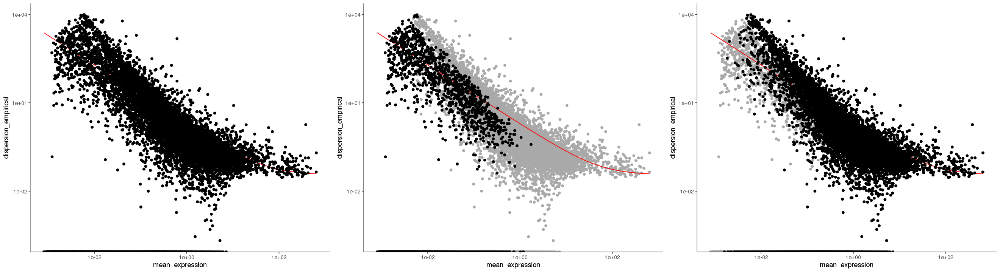

In [217]:
options(repr.plot.width=22, repr.plot.height=6)
pog1 <- plot_ordering_genes(CL10.M)
pog2 <- plot_ordering_genes(CL10.M[setdiff(rownames(CL10.M), ordering_genes),])
pog3 <- plot_ordering_genes(CL10.M.order)
plot_grid(pog1, pog2, pog3, ncol=3)

In [218]:
str(CL10.M)

Formal class 'CellDataSet' [package "monocle"] with 19 slots
  ..@ reducedDimS          : num[0 , 0 ] 
  ..@ reducedDimW          : num[0 , 0 ] 
  ..@ reducedDimA          : num[0 , 0 ] 
  ..@ reducedDimK          : num[0 , 0 ] 
  ..@ minSpanningTree      :Formal class 'igraph' [package "monocle"] with 1 slot
  .. .. ..@ .S3Class: chr "igraph"
  ..@ cellPairwiseDistances: num[0 , 0 ] 
  ..@ expressionFamily     :Formal class 'vglmff' [package "VGAM"] with 22 slots
  .. .. ..@ blurb             : chr [1:6] "Negative-binomial distribution with size known\n\n" "Links:    " "loglink(mu)" "\n" ...
  .. .. ..@ constraints       :  expression({  constraints <- cm.zero.VGAM(constraints, x = x, NULL, M = M, predictors.names = predictors.names,  M1 = 2) })
  .. .. ..@ deviance          :function ()  
  .. .. ..@ fini              :  expression({ })
  .. .. ..@ first             :  expression({ })
  .. .. ..@ infos             :function (...)  
  .. .. ..@ initialize        :  expression({  M1 <-

In [219]:
CL10.M.order <- reduceDimension(CL10.M.order, max_components = 2, reduction_method = "DDRTree")
CL10.M.order <- orderCells(CL10.M.order)

In [220]:
length(rownames(pData(CL10.M.order)))

[1] 14162

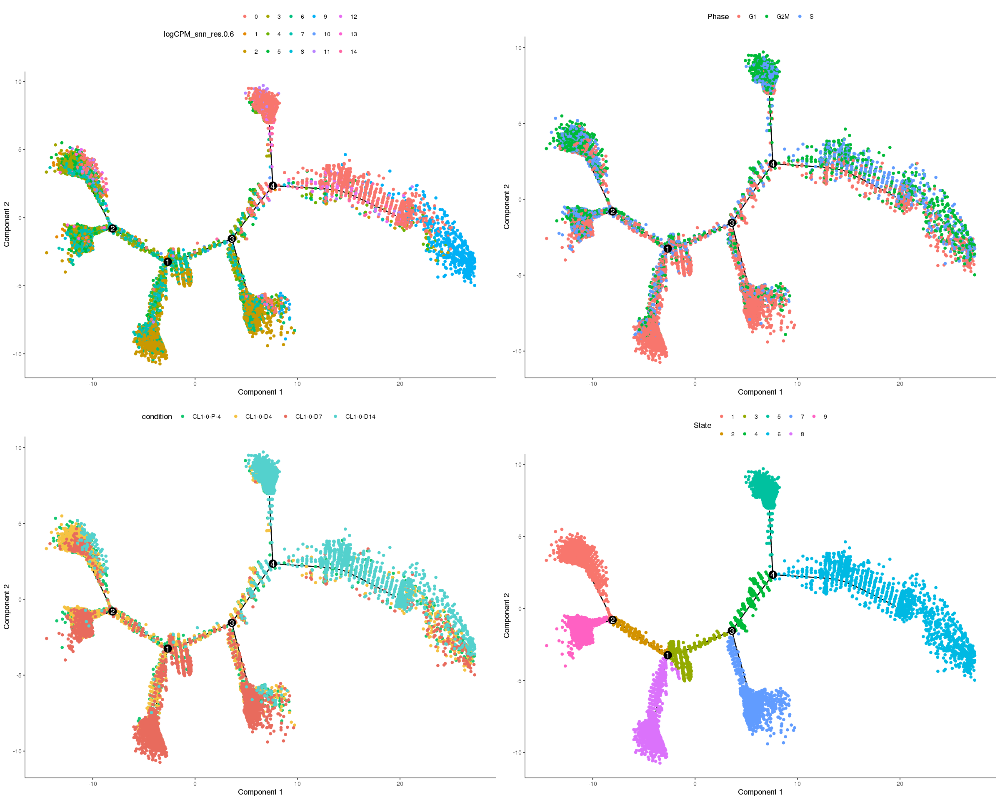

In [221]:
options(repr.plot.width=20, repr.plot.height=16)
trajectoryplot1 <- plot_cell_trajectory(CL10.M.order, color_by = "logCPM_snn_res.0.6")
trajectoryplot2 <- plot_cell_trajectory(CL10.M.order, color_by = "Phase")
trajectoryplot3 <- plot_cell_trajectory(CL10.M.order, color_by = "condition") + 
                   scale_color_manual(values = color_style, breaks = order_list)
trajectoryplot4 <- plot_cell_trajectory(CL10.M.order, color_by = "State", order = order_list, cols = color_style)
plot_grid(trajectoryplot1, trajectoryplot2, trajectoryplot3, trajectoryplot4, ncol=2)

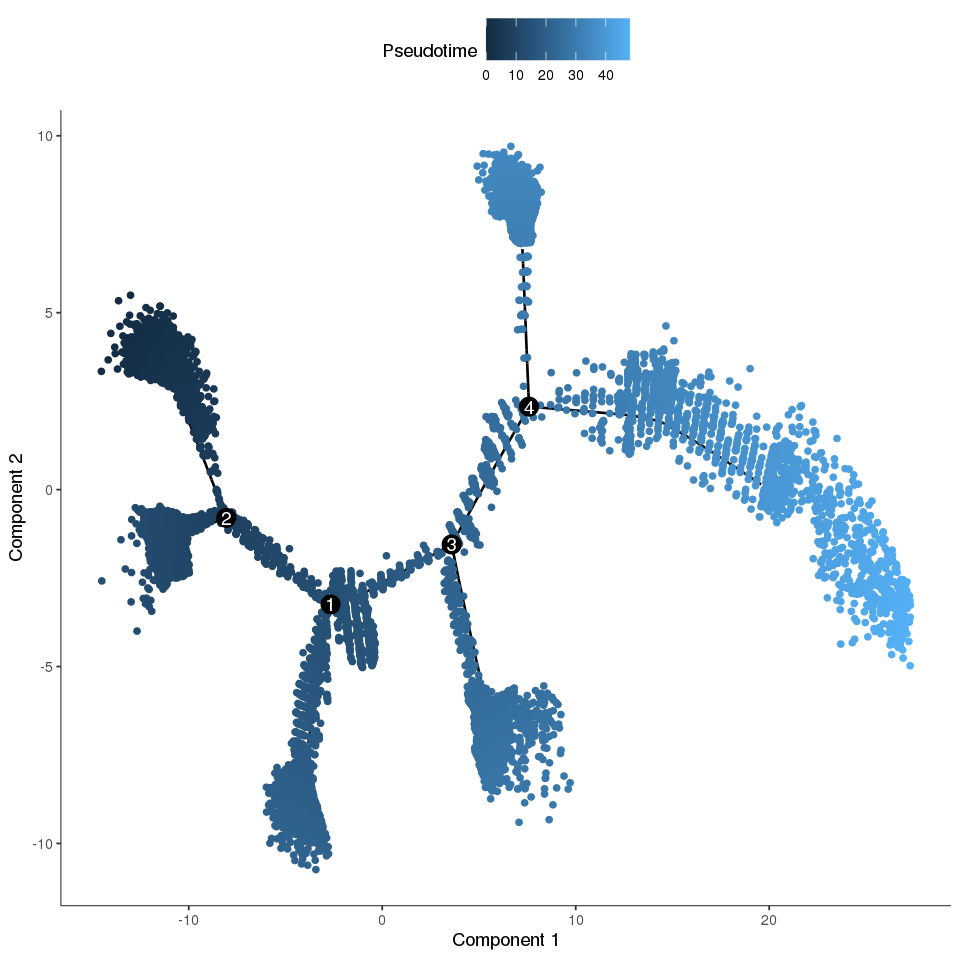

In [222]:
options(repr.plot.width=8, repr.plot.height=8)
GM_state <- function(CL10.M.order){
  if (length(unique(pData(CL10.M.order)$State)) > 1){
    T0_counts <- table(pData(CL10.M.order)$State, pData(CL10.M.order)$seurat_clusters)[,"0"]
    return(as.numeric(names(T0_counts)[which(T0_counts == max(T0_counts))]))
  } else {
    return (1)
  }
}
CL10.M.order <- orderCells(CL10.M.order, root_state = GM_state(CL10.M.order))
plot_cell_trajectory(CL10.M.order, color_by = "Pseudotime")

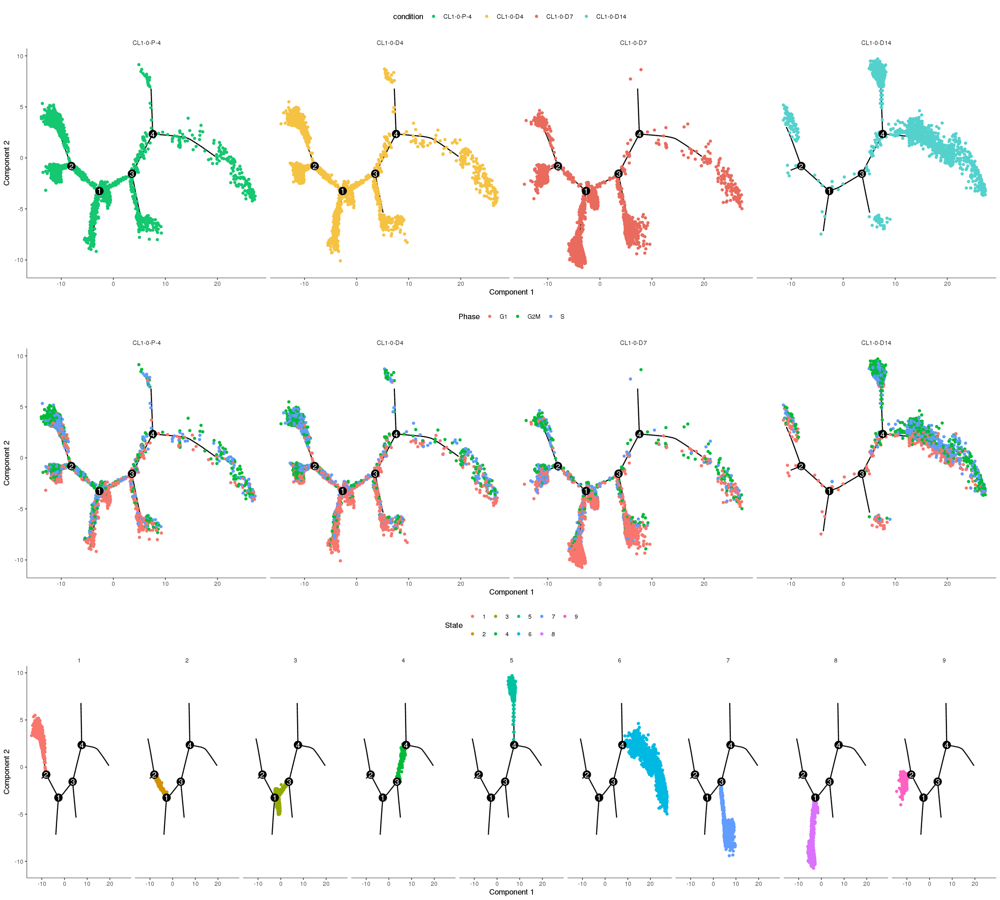

In [223]:
CL10.M.order@phenoData@data$condition<-factor(CL10.M.order@phenoData@data$condition, levels = order_list)
options(repr.plot.width=20, repr.plot.height=18)
facet.trajectory.plot1 <- plot_cell_trajectory(CL10.M.order, color_by = "condition")+
                          scale_color_manual(values = color_style, breaks = order_list)+
                          facet_wrap(~condition, nrow = 1)
facet.trajectory.plot2 <- plot_cell_trajectory(CL10.M.order, color_by = "Phase")+
                          facet_wrap(~condition, nrow = 1)
facet.trajectory.plot3 <- plot_cell_trajectory(CL10.M.order, color_by = "State") +
                          facet_wrap(~State, nrow = 1)
plot_grid(facet.trajectory.plot1, facet.trajectory.plot2, facet.trajectory.plot3, ncol=1)

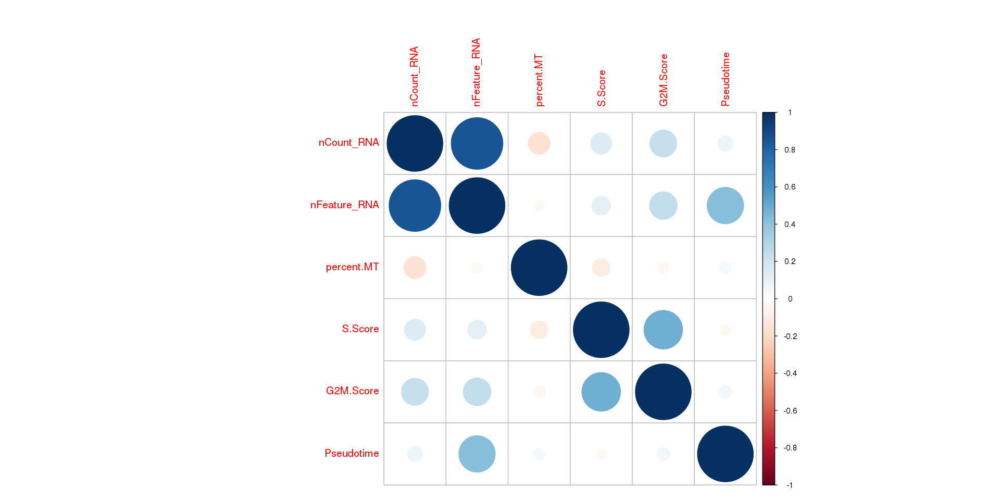

In [36]:
options(repr.plot.width = 16, repr.plot.height = 8)
cor.meta <- cor(CL10.M.order@phenoData@data[, c('nCount_RNA', 'nFeature_RNA', 'percent.MT', 'S.Score', 'G2M.Score', "Pseudotime")], CL10.M.order@phenoData@data[, c('nCount_RNA', 'nFeature_RNA', 'percent.MT', 'S.Score', 'G2M.Score', "Pseudotime")], method = 'spear')
corrplot(cor.meta, method = "circle")

In [37]:
head(CL10.M.order@phenoData@data)

,orig.ident,nCount_RNA,nFeature_RNA,condition,percent.MT,nCount_logCPM,nFeature_logCPM,S.Score,G2M.Score,Phase,...,logCPM_snn_res.0.8,logCPM_snn_res.0.9,logCPM_snn_res.1,logCPM_snn_res.1.1,logCPM_snn_res.1.2,seurat_clusters,Size_Factor,num_genes_expressed,Pseudotime,State
,<chr>,<dbl>,<int>,<ord>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<fct>,...,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<dbl>,<int>,<dbl>,<fct>
AAACCTGAGGATATAC-CL1-0-P-4,Project_1,34903,5160,CL1-0-P-4,6.890525,34903,5160,-0.058171952,0.15100343,G2M,...,3,3,3,3,3,1,0.8636741,1343,26.32846,1
AAACCTGAGGGTCTCC-CL1-0-P-4,Project_1,57950,6302,CL1-0-P-4,4.880069,57950,6302,0.086214927,0.06493860,S,...,13,13,15,16,16,1,1.4339717,2234,31.86303,1
AAACCTGCACATTTCT-CL1-0-P-4,Project_1,50945,5664,CL1-0-P-4,3.232771,50945,5664,0.002628155,0.06374253,G2M,...,3,3,3,3,3,1,1.2606331,1568,15.94262,7
AAACGGGGTCCCTACT-CL1-0-P-4,Project_1,57222,6410,CL1-0-P-4,2.855445,57222,6410,0.004330711,0.27030043,G2M,...,3,3,6,6,6,1,1.4159574,2308,32.41769,1
AAACGGGTCACCATAG-CL1-0-P-4,Project_1,60751,6442,CL1-0-P-4,3.932446,60751,6442,0.084881513,0.03227717,S,...,13,13,15,16,16,1,1.5032824,2301,31.91500,1
AAACGGGTCAGCACAT-CL1-0-P-4,Project_1,58969,6347,CL1-0-P-4,3.637381,58969,6347,0.040126088,0.12370296,G2M,...,16,16,18,19,19,13,1.4591869,2273,32.09110,1


In [87]:
# saveRDS(file="/mnt/isilonX200/scRNA/Project_1/Result/CL10.monocle.Rds", object = CL10.M.order)
CL10.M.order <- readRDS(file="/mnt/isilonX200/scRNA/Project_1/Result/CL10.monocle.Rds")
scdata <- readRDS(file="/mnt/isilonX200/scRNA/Project_1/Result/CL10.merge.Rds")

In [88]:
scdata@meta.data$State <- CL10.M.order@phenoData@data$State

In [39]:
plot.data2 <- scdata@meta.data %>%
    select(condition, cluster = State) %>%
    mutate(cluster = factor(cluster)) %>%
    mutate(condition = factor(condition, levels = order_list))%>%
    group_by(cluster, condition) %>%
    summarise(count = n()) %>%
    mutate(clust_total = sum(count)) %>%
    mutate(clust_prop = count / clust_total) %>%
    group_by(condition) %>%
    mutate(dataset_total = sum(count)) %>%
    ungroup() %>%
    mutate(dataset_prop = count / dataset_total)

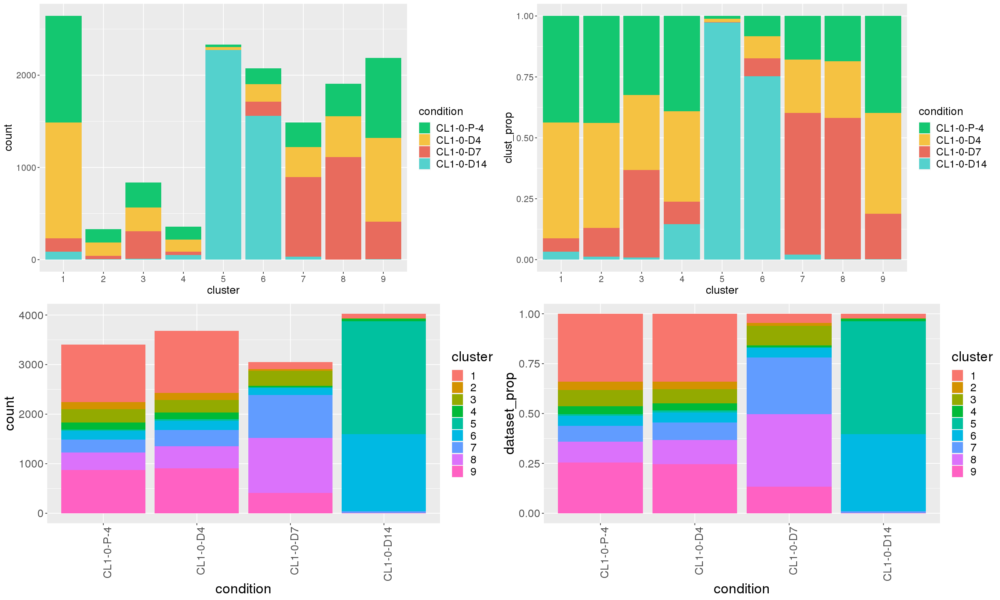

In [40]:
options(repr.plot.width=20, repr.plot.height=12)

gps1<-ggplot(plot.data2, aes(x = cluster, y = count, fill = condition)) +
    geom_col()+
    scale_fill_manual(values = color_style)+
    theme(legend.text=element_text(size=15), text = element_text(size = 16))

gps2<-ggplot(plot.data2, aes(x = cluster, y = clust_prop, fill = condition)) +
    geom_col()+
    scale_fill_manual(values = color_style)+
    theme(legend.text=element_text(size=15), text = element_text(size = 16))

gps3<-ggplot(plot.data2, aes(x = condition, y = count, fill = cluster)) +
    geom_col()+
    theme(text = element_text(size = 20), axis.text.x = element_text(angle=90, hjust=1))

gps4<-ggplot(plot.data2, aes(x = condition, y = dataset_prop, fill = cluster)) +
    geom_col()+
    theme(text = element_text(size = 20), axis.text.x = element_text(angle=90, hjust=1))

plot_grid(gps1, gps2, gps3, gps4, ncol = 2)

In [41]:
Idents(scdata) <- scdata@meta.data$State
scdata.markers <- FindAllMarkers(object = scdata, features = VariableFeatures(scdata)) 
top20 = scdata.markers %>% group_by(cluster) %>% top_n(n = 20, wt = avg_logFC)

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9



In [42]:
head(top20)

p_val,avg_logFC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
0,0.4640118,1.000,0.971,0,1,CKS1B
0,0.4471012,0.992,0.865,0,1,HMGB2
0,0.4196987,0.991,0.811,0,1,SMC4
0,0.3931224,0.980,0.786,0,1,AURKB
0,0.3905976,0.995,0.895,0,1,SLC3A2
0,0.3781029,0.949,0.680,0,1,HMMR


In [43]:
MinMax <- function(data, min, max) {
  data2 <- data
  data2[data2 > max] <- max
  data2[data2 < min] <- min
  return(data2)
}

plot_heatmap <- as.data.frame(x = t(as.matrix(x = t(x = GetAssayData(
    object = scdata,
    slot = 'scale.data')[top20$gene ,cells <- colnames(x = scdata)]))))

annotation_col <- scdata@meta.data[,c("condition", "State"), drop = FALSE]
annotation_col <- annotation_col[order(annotation_col$condition, annotation_col$State),]
plot_heatmap <- plot_heatmap[,rownames(annotation_col)]
plot_heatmap <- MinMax(plot_heatmap,-3.5,3.5)
aka3 = list(condition = color_style)

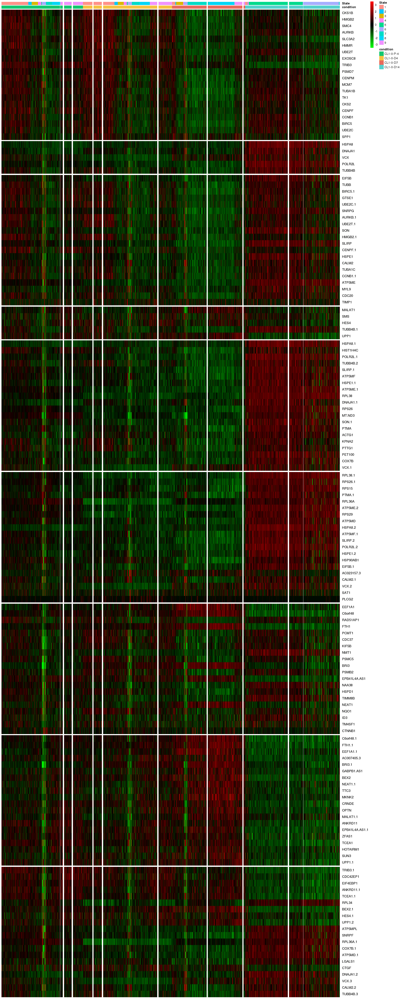

In [44]:
options(repr.plot.width = 18, repr.plot.height = 45)
pheatmap(plot_heatmap,
         annotation_col = annotation_col,
         annotation_colors = aka3[1],
         cluster_rows = FALSE, 
         cluster_cols = FALSE,
         show_colnames = FALSE,
         gaps_row = cumsum(table(top20$cluster)),
         gaps_col = cumsum(table(annotation_col$State)),
         color = greenred(100),
         fontsize_row=11
         )

#### P vs D4

In [166]:
PvD4_scdata <- subset(scdata, subset= condition=="CL1-0-P-4" | condition== "CL1-0-D4")
Idents(PvD4_scdata) <- PvD4_scdata@meta.data$condition
condition.markers <- FindAllMarkers(object = PvD4_scdata, features = VariableFeatures(PvD4_scdata)) 

Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from umap_res0.1_pc_ to umapres01pc_"
Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from tsne_res0.1_pc_ to tsneres01pc_"
Calculating cluster CL1-0-P-4

Calculating cluster CL1-0-D4



In [167]:
PvD4_top20 = condition.markers %>% group_by(cluster) %>% top_n(n = 20, wt = avg_logFC)

In [168]:
MinMax <- function(data, min, max) {
  data2 <- data
  data2[data2 > max] <- max
  data2[data2 < min] <- min
  return(data2)
}

plot_heatmap <- as.data.frame(x = t(as.matrix(x = t(x = GetAssayData(
    object = PvD4_scdata,
    slot = 'scale.data')[PvD4_top20$gene ,cells <- colnames(x = PvD4_scdata)]))))

annotation_col <- PvD4_scdata@meta.data[,c("condition", "State"), drop = FALSE]
annotation_col <- annotation_col[order(annotation_col$condition, annotation_col$State),]
plot_heatmap <- plot_heatmap[,rownames(annotation_col)]
plot_heatmap <- MinMax(plot_heatmap,-3.5,3.5)
aka3 = list(condition = color_style)

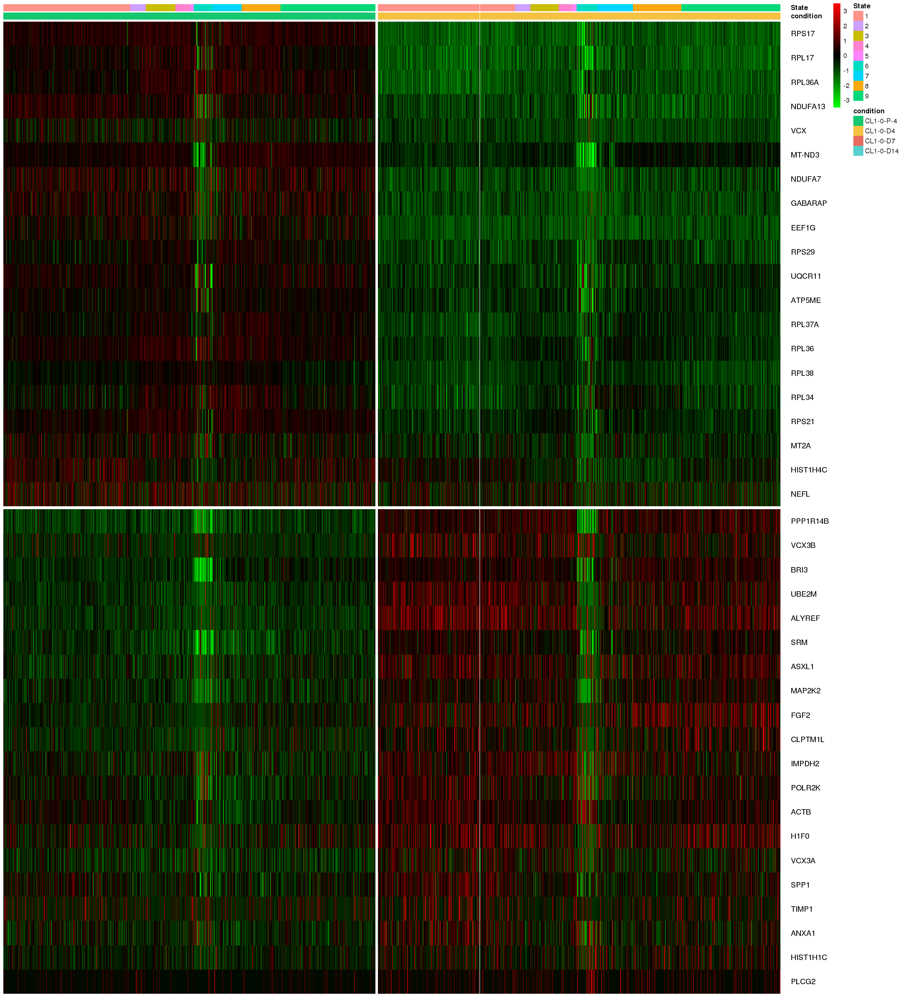

In [170]:
options(repr.plot.width = 18, repr.plot.height = 20)
pheatmap(plot_heatmap,
         annotation_col = annotation_col,
         annotation_colors = aka3[1],
         cluster_rows = FALSE, 
         cluster_cols = FALSE,
         show_colnames = FALSE,
         gaps_row = cumsum(table(PvD4_top20$cluster)),
         gaps_col = cumsum(table(annotation_col$condition)),
         color = greenred(100),
         fontsize_row=11
         )

In [171]:
PvD4_scdata <- subset(scdata, subset= condition=="CL1-0-P-4" | condition== "CL1-0-D4")
Idents(PvD4_scdata) <- PvD4_scdata@meta.data$condition
condition.markers <- FindAllMarkers(object = PvD4_scdata, features = VariableFeatures(PvD4_scdata), slot="scale.data") 

Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from umap_res0.1_pc_ to umapres01pc_"
Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from tsne_res0.1_pc_ to tsneres01pc_"
Calculating cluster CL1-0-P-4

Calculating cluster CL1-0-D4



In [173]:
PvD4_top20_scale = condition.markers %>% group_by(cluster) %>% top_n(n = 20, wt = avg_diff)

In [174]:
MinMax <- function(data, min, max) {
  data2 <- data
  data2[data2 > max] <- max
  data2[data2 < min] <- min
  return(data2)
}

plot_heatmap <- as.data.frame(x = t(as.matrix(x = t(x = GetAssayData(
    object = PvD4_scdata,
    slot = 'scale.data')[PvD4_top20_scale$gene ,cells <- colnames(x = PvD4_scdata)]))))

annotation_col <- PvD4_scdata@meta.data[,c("condition", "State"), drop = FALSE]
annotation_col <- annotation_col[order(annotation_col$condition, annotation_col$State),]
plot_heatmap <- plot_heatmap[,rownames(annotation_col)]
plot_heatmap <- MinMax(plot_heatmap,-3.5,3.5)
aka3 = list(condition = color_style)

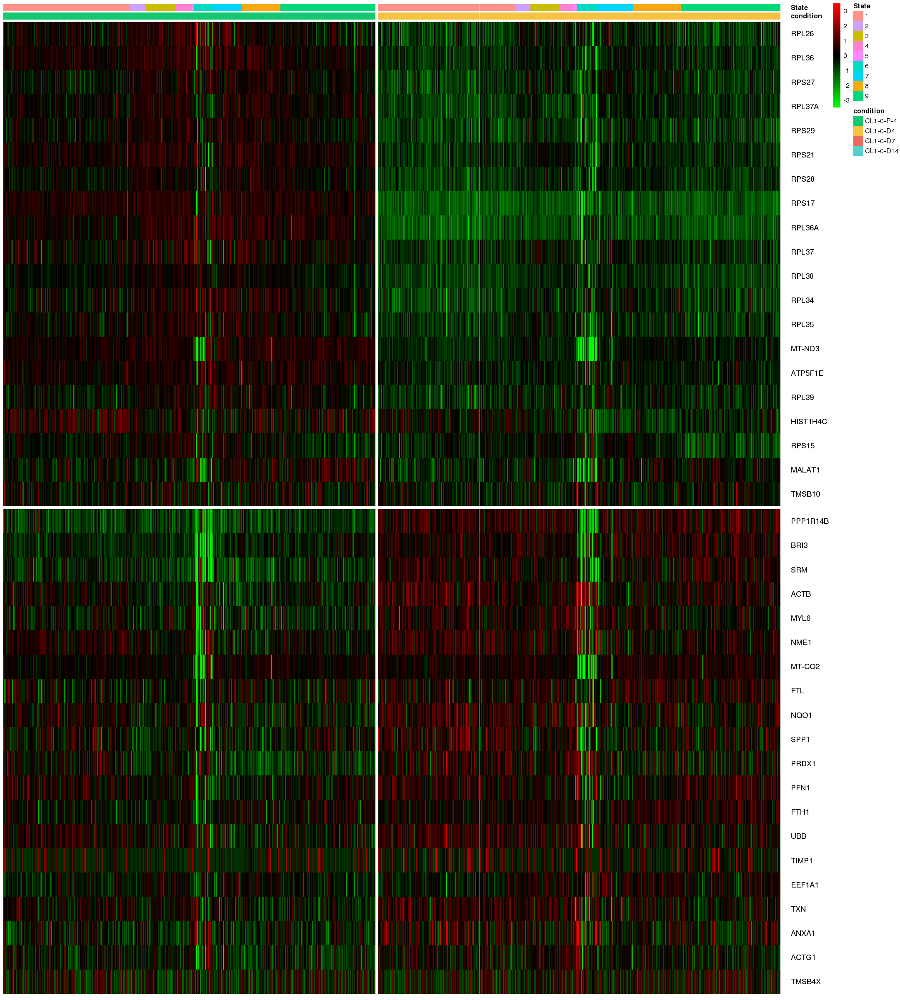

In [175]:
options(repr.plot.width = 18, repr.plot.height = 20)
pheatmap(plot_heatmap,
         annotation_col = annotation_col,
         annotation_colors = aka3[1],
         cluster_rows = FALSE, 
         cluster_cols = FALSE,
         show_colnames = FALSE,
         gaps_row = cumsum(table(PvD4_top20$cluster)),
         gaps_col = cumsum(table(annotation_col$condition)),
         color = greenred(100),
         fontsize_row=11
         )

#### P vs D7

In [149]:
PvD7_scdata <- subset(scdata, subset= condition=="CL1-0-P-4" | condition== "CL1-0-D7")
Idents(PvD7_scdata) <- PvD7_scdata@meta.data$condition
condition.markers <- FindAllMarkers(object = PvD7_scdata, features = VariableFeatures(PvD7_scdata)) 

Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from umap_res0.1_pc_ to umapres01pc_"
Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from tsne_res0.1_pc_ to tsneres01pc_"
Calculating cluster CL1-0-P-4

Calculating cluster CL1-0-D7



In [150]:
PvD7_top20 = condition.markers %>% group_by(cluster) %>% top_n(n = 20, wt = avg_logFC)

In [151]:
MinMax <- function(data, min, max) {
  data2 <- data
  data2[data2 > max] <- max
  data2[data2 < min] <- min
  return(data2)
}

plot_heatmap <- as.data.frame(x = t(as.matrix(x = t(x = GetAssayData(
    object = PvD7_scdata,
    slot = 'scale.data')[PvD7_top20$gene ,cells <- colnames(x = PvD7_scdata)]))))

annotation_col <- PvD7_scdata@meta.data[,c("condition", "State"), drop = FALSE]
annotation_col <- annotation_col[order(annotation_col$condition, annotation_col$State),]
plot_heatmap <- plot_heatmap[,rownames(annotation_col)]
plot_heatmap <- MinMax(plot_heatmap,-3.5,3.5)
aka3 = list(condition = color_style)

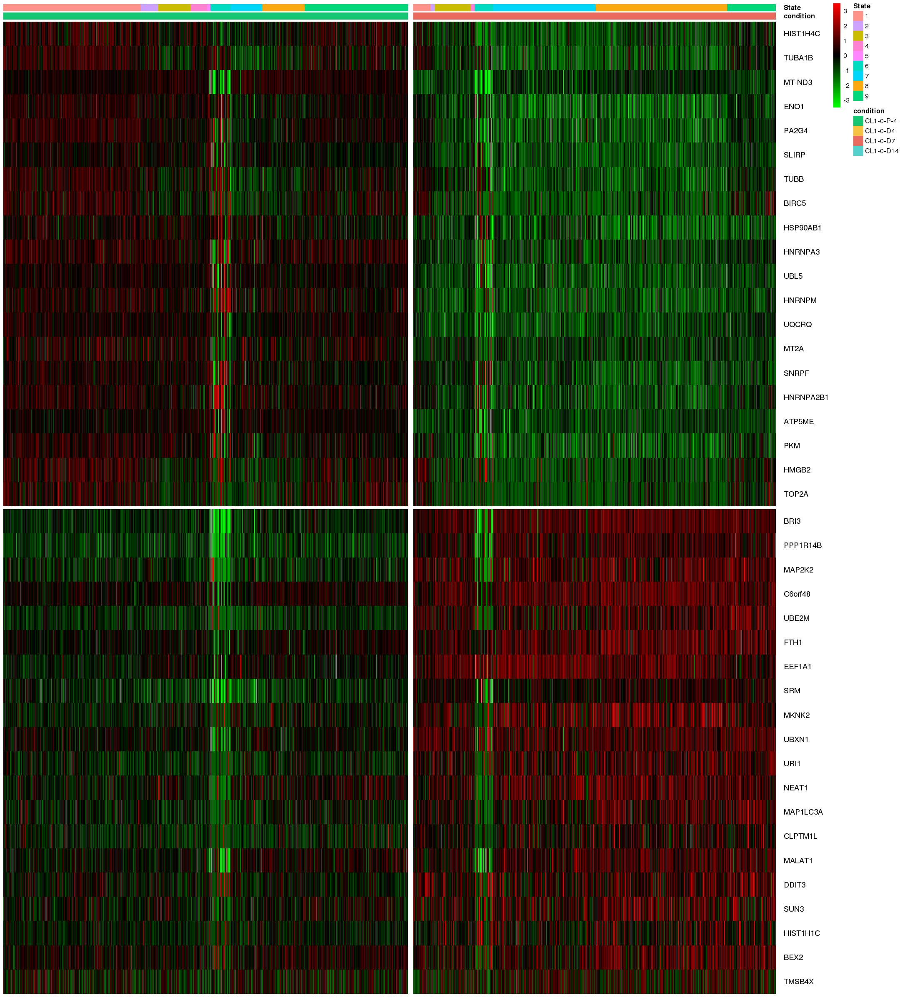

In [152]:
options(repr.plot.width = 18, repr.plot.height = 20)
pheatmap(plot_heatmap,
         annotation_col = annotation_col,
         annotation_colors = aka3[1],
         cluster_rows = FALSE, 
         cluster_cols = FALSE,
         show_colnames = FALSE,
         gaps_row = cumsum(table(PvD7_top20$cluster)),
         gaps_col = cumsum(table(annotation_col$condition)),
         color = greenred(100),
         fontsize_row=11
         )

In [153]:
PvD7_scdata <- subset(scdata, subset= condition=="CL1-0-P-4" | condition== "CL1-0-D7")
Idents(PvD7_scdata) <- PvD7_scdata@meta.data$condition
condition.markers <- FindAllMarkers(object = PvD7_scdata, features = VariableFeatures(PvD7_scdata), slot="scale.data") 

Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from umap_res0.1_pc_ to umapres01pc_"
Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from tsne_res0.1_pc_ to tsneres01pc_"
Calculating cluster CL1-0-P-4

Calculating cluster CL1-0-D7



In [154]:
PvD7_top20_scale = condition.markers %>% group_by(cluster) %>% top_n(n = 20, wt = avg_diff)

In [155]:
MinMax <- function(data, min, max) {
  data2 <- data
  data2[data2 > max] <- max
  data2[data2 < min] <- min
  return(data2)
}

plot_heatmap <- as.data.frame(x = t(as.matrix(x = t(x = GetAssayData(
    object = PvD7_scdata,
    slot = 'scale.data')[PvD7_top20_scale$gene ,cells <- colnames(x = PvD7_scdata)]))))

annotation_col <- PvD7_scdata@meta.data[,c("condition", "State"), drop = FALSE]
annotation_col <- annotation_col[order(annotation_col$condition, annotation_col$State),]
plot_heatmap <- plot_heatmap[,rownames(annotation_col)]
plot_heatmap <- MinMax(plot_heatmap,-3.5,3.5)
aka3 = list(condition = color_style)

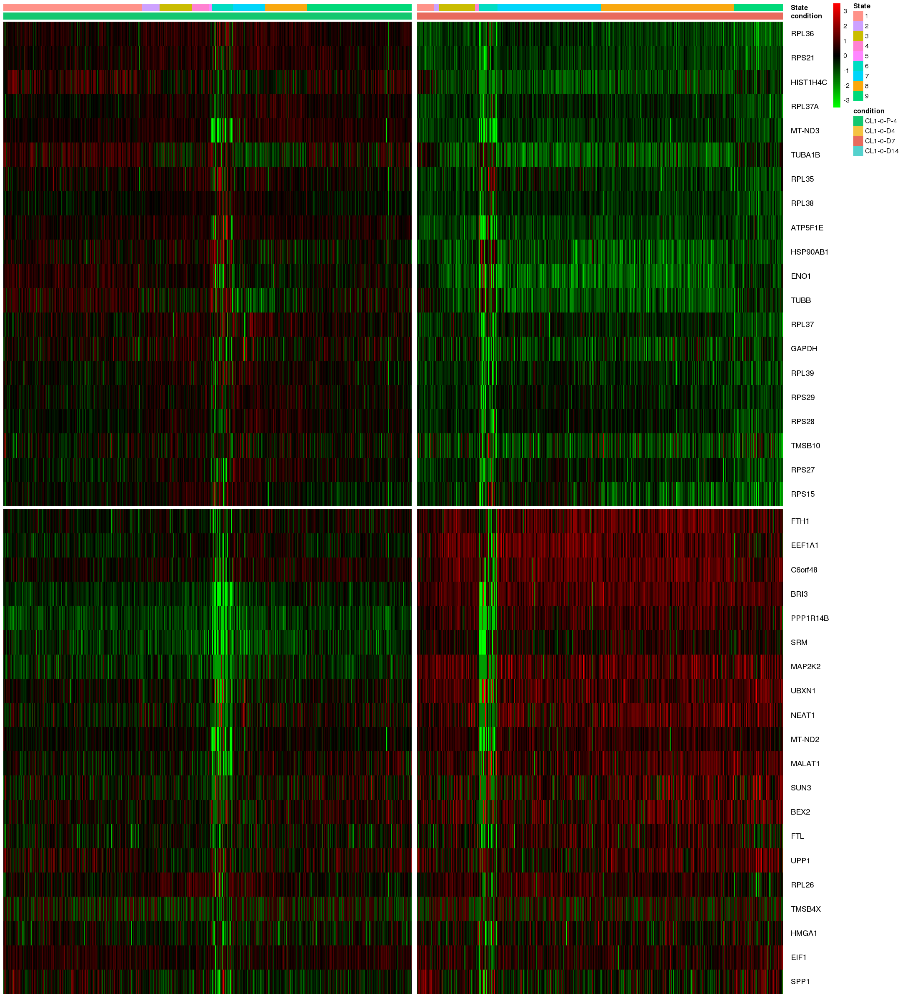

In [156]:
options(repr.plot.width = 18, repr.plot.height = 20)
pheatmap(plot_heatmap,
         annotation_col = annotation_col,
         annotation_colors = aka3[1],
         cluster_rows = FALSE, 
         cluster_cols = FALSE,
         show_colnames = FALSE,
         gaps_row = cumsum(table(PvD7_top20$cluster)),
         gaps_col = cumsum(table(annotation_col$condition)),
         color = greenred(100),
         fontsize_row=11
         )

#### p vs D14

In [96]:
PvD14_scdata <- subset(scdata, subset= condition=="CL1-0-P-4" | condition== "CL1-0-D14")
Idents(PvD14_scdata) <- PvD14_scdata@meta.data$condition
condition.markers <- FindAllMarkers(object = PvD14_scdata, features = VariableFeatures(PvD14_scdata)) 

Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from umap_res0.1_pc_ to umapres01pc_"
Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from tsne_res0.1_pc_ to tsneres01pc_"
Calculating cluster CL1-0-P-4

Calculating cluster CL1-0-D14



In [97]:
PvD14_top20 = condition.markers %>% group_by(cluster) %>% top_n(n = 20, wt = avg_logFC)

In [98]:
MinMax <- function(data, min, max) {
  data2 <- data
  data2[data2 > max] <- max
  data2[data2 < min] <- min
  return(data2)
}

plot_heatmap <- as.data.frame(x = t(as.matrix(x = t(x = GetAssayData(
    object = PvD14_scdata,
    slot = 'scale.data')[PvD14_top20$gene ,cells <- colnames(x = PvD14_scdata)]))))

annotation_col <- PvD14_scdata@meta.data[,c("condition", "State"), drop = FALSE]
annotation_col <- annotation_col[order(annotation_col$condition, annotation_col$State),]
plot_heatmap <- plot_heatmap[,rownames(annotation_col)]
plot_heatmap <- MinMax(plot_heatmap,-3.5,3.5)
aka3 = list(condition = color_style)

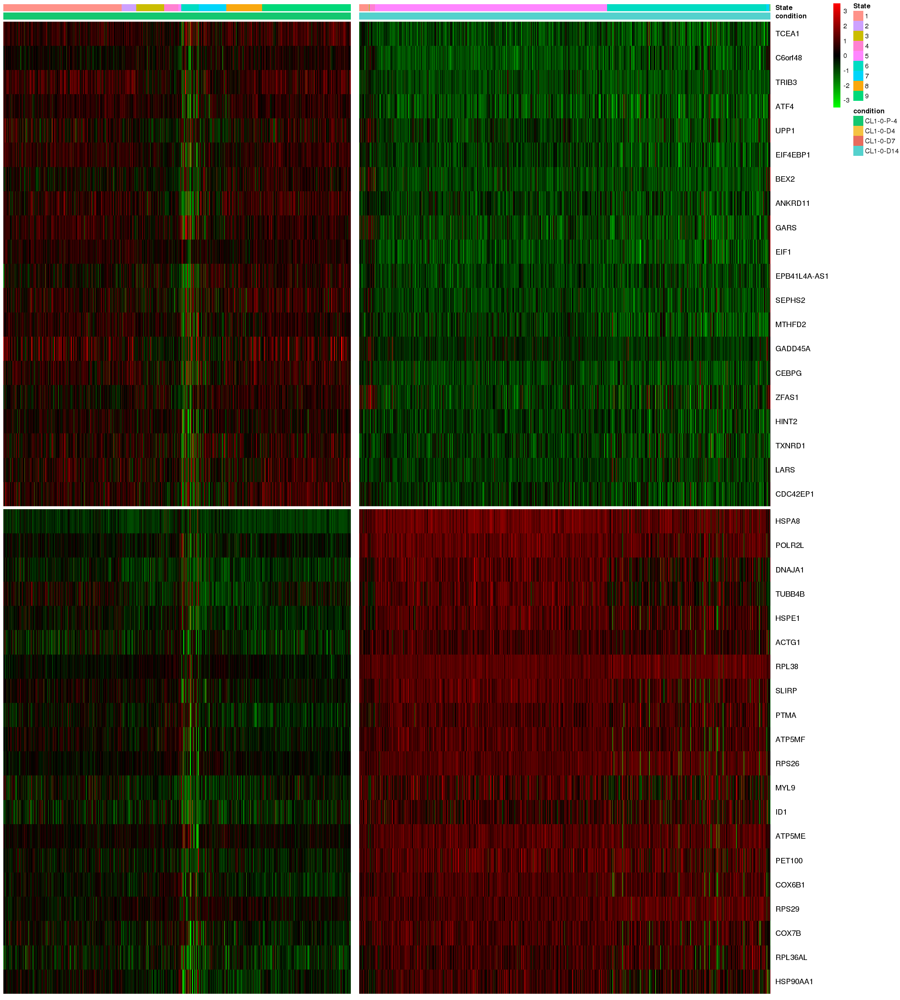

In [99]:
options(repr.plot.width = 18, repr.plot.height = 20)
pheatmap(plot_heatmap,
         annotation_col = annotation_col,
         annotation_colors = aka3[1],
         cluster_rows = FALSE, 
         cluster_cols = FALSE,
         show_colnames = FALSE,
         gaps_row = cumsum(table(PvD14_top20$cluster)),
         gaps_col = cumsum(table(annotation_col$condition)),
         color = greenred(100),
         fontsize_row=11
         )

#### P v D14 scale

In [100]:
PvD14_scdata <- subset(scdata, subset= condition=="CL1-0-P-4" | condition== "CL1-0-D14")
Idents(PvD14_scdata) <- PvD14_scdata@meta.data$condition
condition.markers <- FindAllMarkers(object = PvD14_scdata, features = VariableFeatures(PvD14_scdata), slot="scale.data") 

Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from umap_res0.1_pc_ to umapres01pc_"
Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from tsne_res0.1_pc_ to tsneres01pc_"
Calculating cluster CL1-0-P-4

Calculating cluster CL1-0-D14



In [101]:
PvD14_top20_scale = condition.markers %>% group_by(cluster) %>% top_n(n = 20, wt = avg_diff)

In [75]:
MinMax <- function(data, min, max) {
  data2 <- data
  data2[data2 > max] <- max
  data2[data2 < min] <- min
  return(data2)
}

plot_heatmap <- as.data.frame(x = t(as.matrix(x = t(x = GetAssayData(
    object = PvD14_scdata,
    slot = 'scale.data')[PvD14_top20_scale$gene ,cells <- colnames(x = PvD14_scdata)]))))

annotation_col <- PvD14_scdata@meta.data[,c("condition", "State"), drop = FALSE]
annotation_col <- annotation_col[order(annotation_col$condition, annotation_col$State),]
plot_heatmap <- plot_heatmap[,rownames(annotation_col)]
plot_heatmap <- MinMax(plot_heatmap,-3.5,3.5)
aka3 = list(condition = color_style)

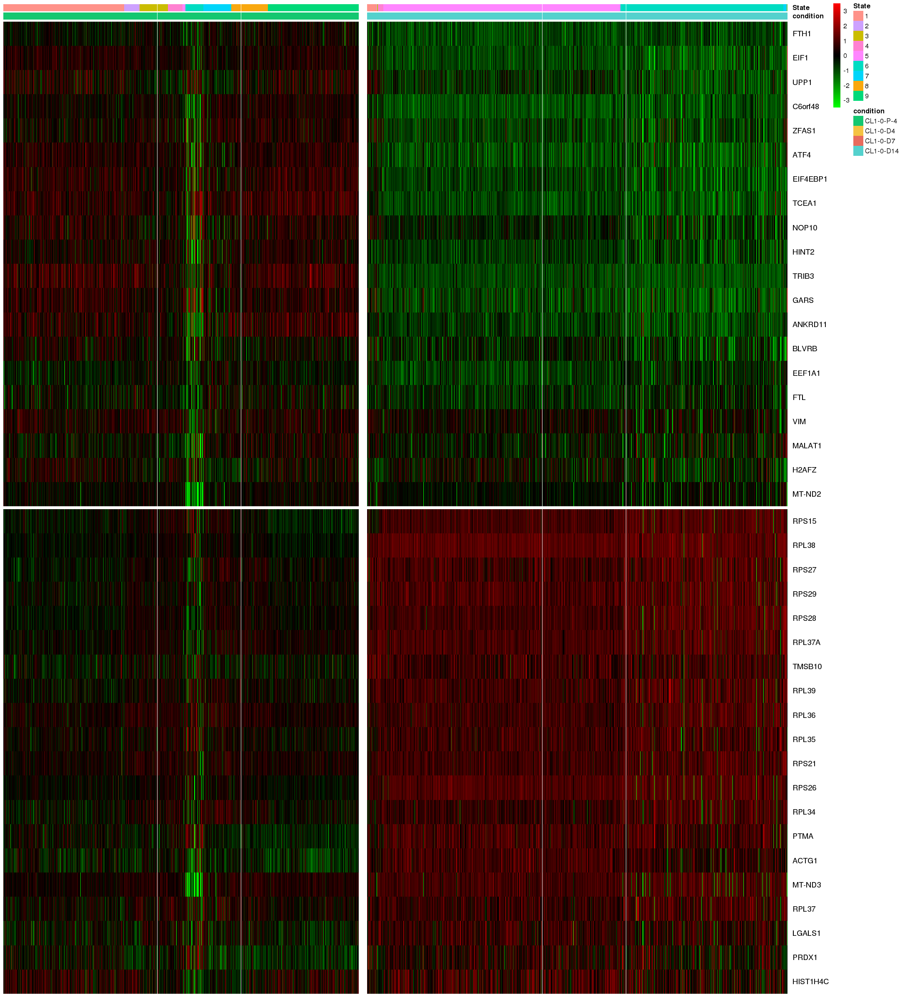

In [77]:
options(repr.plot.width = 18, repr.plot.height = 20)
pheatmap(plot_heatmap,
         annotation_col = annotation_col,
         annotation_colors = aka3[1],
         cluster_rows = FALSE, 
         cluster_cols = FALSE,
         show_colnames = FALSE,
         gaps_row = cumsum(table(PvD14_top20_scale$cluster)),
         gaps_col = cumsum(table(annotation_col$condition)),
         color = greenred(100),
         fontsize_row=11
         )

## Compare Scale and data

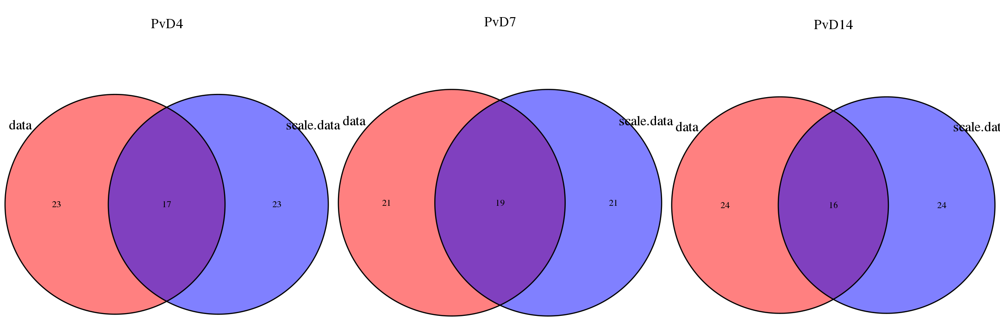

In [180]:
options(repr.plot.width=18,repr.plot.height=6)
PvD4_ven <- venn.diagram(
            list(PvD4_top20$gene, PvD4_top20_scale$gene),
            category.names=c("data","scale.data"),
            fill=c("red","blue"),
            cat.cex =1.5,
            alpha=c(rep(0.5,2)),
            filename=NULL,
            main="PvD4",
            main.cex=1.5
            )
PvD7_ven <- venn.diagram(
            list(PvD7_top20$gene, PvD7_top20_scale$gene),
            category.names=c("data","scale.data"),
            fill=c("red","blue"),
            cat.cex =1.5,
            alpha=c(rep(0.5,2)),
            filename=NULL,
            main="PvD7",
            main.cex=1.5
            )
PvD14_ven <- venn.diagram(
            list(PvD14_top20$gene, PvD14_top20_scale$gene),
            category.names=c("data","scale.data"),
            fill=c("red","blue"),
            cat.cex =1.5,
            alpha=c(rep(0.5,2)),
            filename=NULL,
            main="PvD14",
            main.cex=1.5
            )
plot_grid(PvD4_ven, PvD7_ven, PvD14_ven, ncol=3)

## State 6 v 7

In [187]:
state6v7 <- subset(scdata, subset= State==6 | State== 7)
Idents(state6v7) <- state6v7@meta.data$State
condition.markers <- FindAllMarkers(object = state6v7, features = VariableFeatures(state6v7), slot="data") 

Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from umap_res0.1_pc_ to umapres01pc_"
Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from tsne_res0.1_pc_ to tsneres01pc_"
Calculating cluster 6

Calculating cluster 7



In [189]:
state6v7_top20 = condition.markers %>% group_by(cluster) %>% top_n(n = 20, wt = avg_logFC)

In [225]:
head(condition.markers)

,p_val,avg_logFC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
FTH1,0.000000e+00,-0.6198573,0.997,1.000,0.000000e+00,6,FTH1
C6orf48,0.000000e+00,-0.9698379,0.862,0.993,0.000000e+00,6,C6orf48
BRI3,2.084306e-263,-0.6365645,0.812,0.987,3.937255e-259,6,BRI3
SNRPG,1.079867e-262,0.6669884,0.922,0.982,2.039868e-258,6,SNRPG
EPB41L4A-AS1,2.050686e-262,-0.5529942,0.726,0.958,3.873745e-258,6,EPB41L4A-AS1
RPL38,1.644724e-260,0.5547016,0.984,1.000,3.106884e-256,6,RPL38


In [201]:
MinMax <- function(data, min, max) {
  data2 <- data
  data2[data2 > max] <- max
  data2[data2 < min] <- min
  return(data2)
}

plot_heatmap <- as.data.frame(x = t(as.matrix(x = t(x = GetAssayData(
    object = state6v7,
    slot = 'scale.data')[state6v7_top20$gene ,cells <- colnames(x = state6v7)]))))

annotation_col <- state6v7@meta.data[,c("State", "Phase"), drop = FALSE]
annotation_col <- annotation_col[order(annotation_col$State, annotation_col$Phase),]
plot_heatmap <- plot_heatmap[,rownames(annotation_col)]
plot_heatmap <- MinMax(plot_heatmap,-3.5,3.5)
aka3 = list(condition = color_style)

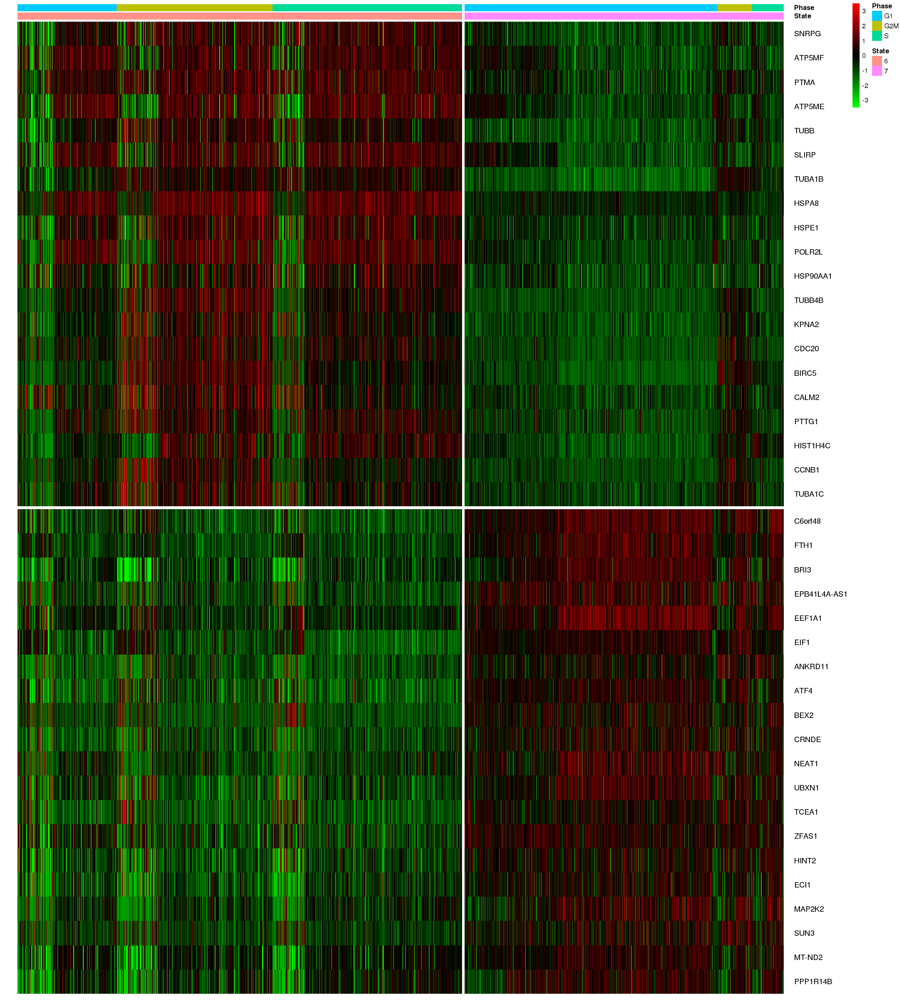

In [202]:
options(repr.plot.width = 18, repr.plot.height = 20)
pheatmap(plot_heatmap,
         annotation_col = annotation_col,
         annotation_colors = aka3[1],
         cluster_rows = FALSE, 
         cluster_cols = FALSE,
         show_colnames = FALSE,
         gaps_row = cumsum(table(state6v7_top20$cluster)),
         gaps_col = cumsum(table(annotation_col$State)),
         color = greenred(100),
         fontsize_row=11
         )